# 2. Instance Segmentation using Azure AutoML for Images
![Example](img/example1.jpg)

## Introduction
This notebook provides a step-by-step guide to building an instance segmentation model using Azure AutoML for Images. It is designed to help data scientists and engineers streamline the process of training, tuning, and deploying computer vision models without extensive manual configuration.
Key highlights include:

- Environment Setup: Configure Azure ML workspace, compute resources, and dependencies.
- Data Preparation: Load and preprocess image datasets for segmentation tasks.
- Automated Training: Leverage AutoML to optimize hyperparameters and improve model performance.
- Experiment Tracking: Use MLflow integration for monitoring and reproducibility.
- Visualization: Display segmentation outputs with Matplotlib and OpenCV for quick evaluation.

## AutoML process
![Example](img/automlprocess.png)

## Documentation
- https://learn.microsoft.com/en-us/azure/machine-learning/concept-automated-ml#computer-vision-preview
- https://learn.microsoft.com/en-us/azure/machine-learning/how-to-auto-train-image-models?view=azureml-api-2&tabs=cli#supported-model-architectures

## Tutorials & Notebooks
- https://github.com/Azure/azureml-examples/blob/main/sdk/python/jobs/automl-standalone-jobs/automl-image-instance-segmentation-task-fridge-items/automl-image-instance-segmentation-task-fridge-items.ipynb

In [ ]:
%pip install "numpy<2" opencv-python-headless seaborn

In [1]:
import base64
import cv2
import datetime
import json
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import mlflow
import mltable
import numpy as np
import os
import pandas as pd
import platform
import psutil
import random
import requests
import seaborn as sns
import shutil
import sys
import time

from azure.ai.ml import automl, Input, MLClient
from azure.ai.ml.automl import SearchSpace, InstanceSegmentationPrimaryMetrics
from azure.ai.ml.constants import AssetTypes
from azure.ai.ml.entities import (
    AmlCompute,
    CodeConfiguration,
    Data,
    Environment,
    ManagedOnlineEndpoint,
    ManagedOnlineDeployment,
    Model,
    OnlineRequestSettings,
    ProbeSettings,
)
from azure.ai.ml.sweep import BanditPolicy, Choice, Uniform
from azure.core.exceptions import ResourceNotFoundError
from azure.identity import DefaultAzureCredential
from azureml.core import Workspace, Datastore, Dataset
from azure.ai.ml.entities import AmlCompute
from azure.core.exceptions import ResourceNotFoundError
from azureml.data import DataType
from dotenv import load_dotenv
from matplotlib.patches import Polygon as MPLPolygon, Rectangle
from mlflow.tracking.client import MlflowClient
from PIL import Image
from typing import Optional

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/mlflow/__init__.py:41: UserWarning: Versions of mlflow (3.1.1) and mlflow-skinny (2.22.1) are different. This may lead to unexpected behavior. Please install the same version of both packages.
  mlflow.mismatch._check_version_mismatch()


## 1. Informations and settings

In [2]:
tags = {
    "cloud provider": "Microsoft Azure",
    "data source":
    "https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images",
    "department": "Data science",
    "topic": "Images instance segmentation",
    "tools": "AutoML for images Azure ML",
    "usecase": "Street instance segmentation 2025",
    "tags": "car, pedestrian",
    "version": "1.0",
}

tags

{'cloud provider': 'Microsoft Azure',
 'data source': 'https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images',
 'department': 'Data science',
 'topic': 'Images instance segmentation',
 'tools': 'AutoML for images Azure ML',
 'usecase': 'Street instance segmentation 2025',
 'tags': 'car, pedestrian',
 'version': '1.0'}

In [3]:
LABELS_DIR = "labels"  # jsonl labels
TEST_DIR = "tests_segmentation"  # tests images
IMAGES_DIR = "images_segmentation"
os.makedirs(TEST_DIR, exist_ok=True)
os.makedirs(LABELS_DIR, exist_ok=True)

In [4]:
MODEL_DIR = "models"

os.makedirs(MODEL_DIR, exist_ok=True)

In [5]:
RESULTS_DIR = "results"

os.makedirs(RESULTS_DIR, exist_ok=True)

## 2. Helper

In [9]:
def display_random_images(image_dir, num_images=15, images_per_row=5):
    """
    Display random images from a directory in a grid layout.
    
    Parameters:
    - image_dir: path to the directory containing images
    - num_images: total number of images to display
    - images_per_row: number of images per row
    """
    # Get all image files from the directory
    valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff'}
    image_files = [f for f in os.listdir(image_dir) 
                   if os.path.splitext(f.lower())[1] in valid_extensions]
    
    # Select random images
    num_images = min(num_images, len(image_files))
    selected_images = random.sample(image_files, num_images)
    
    # Calculate number of rows needed
    num_rows = (num_images + images_per_row - 1) // images_per_row
    
    # Create the plot
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, 3 * num_rows))
    
    # Flatten axes array for easier iteration
    if num_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    # Display images
    for idx, img_file in enumerate(selected_images):
        img_path = os.path.join(image_dir, img_file)
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].axis('off')
        axes[idx].set_title(img_file, fontsize=10)
    
    # Hide any unused subplots
    for idx in range(num_images, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

In [7]:
# Define status emoji mapping for the job status
status_emojis = {
    "Completed": "✅",
    "Running": "🔄",
    "Failed": "❌",
    "Canceled": "🚫",
    "NotStarted": "⏳",
    "Starting": "🚀",
    "Provisioning": "⚙️",
    "Preparing": "📦",
    "Queued": "⏰",
    "Finalizing": "🏁",
    "CancelRequested": "⚠️",
    "NotResponding": "💤",
    "Paused": "⏸️",
    "Unknown": "❓"
}

In [10]:
def create_ml_table_file(filename: str) -> str:
    """
    Generates MLTable configuration content for a given filename.

    Args:
        filename (str): Name of the file to include in the MLTable.

    Returns:
        str: MLTable configuration as a formatted string.
    """
    return ("paths:\n"
            "  - file: ./{0}\n"
            "transformations:\n"
            "  - read_json_lines:\n"
            "        encoding: utf8\n"
            "        invalid_lines: error\n"
            "        include_path_column: false\n"
            "  - convert_column_types:\n"
            "      - columns: image_url\n"
            "        column_type: stream_info").format(filename)

In [11]:
def save_ml_table_file(output_path: str, mltable_file_contents: str) -> None:
    """
    Saves MLTable configuration content to a file named 'MLTable' in the specified output path.

    Args:
        output_path (str): Directory where the MLTable file will be saved.
        mltable_file_contents (str): The content to write into the MLTable file.
    """
    with open(os.path.join(output_path, "MLTable"), "w") as f:
        f.write(mltable_file_contents)

In [12]:
def get_job_status():
    """"
    Get job status information
    """
    job = ml_client.jobs.get(returned_job.name)
    print("\n" + "="*80)
    print(f"📋 JOB PROPERTIES SUMMARY {returned_job.name}")
    print("="*80 + "\n")

    # Categorize properties
    important_props = {
        'task_type': '🎯',
        'primary_metric': '📊',
        'target': '🖥️',
        'num_iterations': '🔢',
        'training_type': '🏋️',
    }

    # Print important properties first
    print("🌟 Key Settings:")
    for key, emoji in important_props.items():
        if key in job.properties:
            print(f"  {emoji} {key}: {job.properties[key]}")
    print()

    # Print AML Settings in readable format
    if 'AMLSettingsJsonString' in job.properties:
        print("⚙️  AutoML Configuration:")
        try:
            settings = json.loads(job.properties['AMLSettingsJsonString'])
        
            # Show most relevant settings
            key_settings = {
                'task_type': 'Task Type',
                'iterations': 'Iterations',
                'max_concurrent_iterations': 'Max Concurrent',
                'experiment_timeout_minutes': 'Timeout (min)',
                'enable_early_stopping': 'Early Stopping',
                'early_stopping_n_iters': 'Early Stop After',
                'vm_type': 'VM Type',
                'vm_priority': 'VM Priority',
            }
        
            for key, label in key_settings.items():
                if key in settings:
                    print(f"  • {label}: {settings[key]}")
        except:
            print("  [Could not parse settings]")
        print()

    # Print data configuration
    if 'mltable_data_json' in job.properties:
        print("📦 Data Configuration:")
        try:
            data_config = json.loads(job.properties['mltable_data_json'])
            print(f"  • Type: {data_config.get('Type', 'N/A')}")
            if 'TrainData' in data_config:
                print(f"  • Training Data: ✅")
            if 'ValidData' in data_config:
                print(f"  • Validation Data: ✅")
            if 'TestData' in data_config and data_config['TestData']:
                print(f"  • Test Data: ✅")
            else:
                print(f"  • Test Data: ❌")
        except:
            print("  [Could not parse data config]")
        print()

In [13]:
def get_predictions(image_file: str) -> dict:
    """
    Sends an image to an online endpoint for prediction and returns the results.

    Args:
        image_file (str): Path to the image file.

    Returns:
        dict: Prediction results from the endpoint.
    """
    # Reading & encoding image
    with open(image_file, "rb") as img:
        encoded_image = base64.encodebytes(img.read()).decode("utf-8")

    # Payload
    request_json = {
        "input_data": {
            "columns": ["image"],
            "data": [encoded_image],
        }
    }

    request_file_name = os.path.join(MODEL_DIR, "request.json")

    # Opening file
    with open(request_file_name, "w") as request_file:
        json.dump(request_json, request_file)

    # Calling the endpoint
    response = ml_client.online_endpoints.invoke(
        endpoint_name=online_endpoint_name,
        deployment_name=deployment.name,
        request_file=request_file_name,
    )

    return json.loads(response)

In [14]:
def print_results(image_file: str, results: list) -> tuple[int, int, int]:
    """
    Prints prediction results for an image and returns counts of detected objects.

    Args:
        results (list): Prediction results from the model.
        image_file (str): Name or path of the image file.

    Returns:
        tuple[int, int, int]: Counts of cars, pedestrians, and total tags.
    """
    # Parsing the results
    labels = [item['label'] for item in results[0]['boxes']]
    nb_cars = labels.count('car')
    nb_pedestrians = labels.count('pedestrian')
    nb_tags = len(labels)

    # Printing the results
    print(f"Predictions for image: '{image_file}'\n")
    print(f"🚗 Detected cars = {nb_cars}")
    print(f"🚶 Detected pedestrians = {nb_pedestrians}")
    print(f"📊 Total = {nb_tags}")

    return nb_cars, nb_pedestrians, nb_tags

In [15]:
def view_results(image_path: str,
                 results: list,
                 min_conf: float = 0.5) -> None:
    """
    Visualizes detection results on an image with bounding boxes and polygons.

    Args:
        image_path (str): Path to the image file.
        results (list): Prediction results containing 'boxes' with labels, scores, and polygons.
        min_conf (float): Minimum confidence threshold for displaying detections.
    """
    alpha = 0.5

    # Loading image
    img = cv2.imread(image_path)
    if img is None:
        print(f"❌ Error: Could not load image from {image_path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width = img_rgb.shape[:2]

    # Creating plot
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    ax.imshow(img_rgb)

    # Process detections
    for result in results:
        for detection in result['boxes']:
            if detection['score'] >= min_conf:
                label = detection['label']
                score = detection['score']
                box = detection['box']
                polygon = detection['polygon']
                
                # Generate a light random RGB color
                r = random.randint(128, 255)
                g = random.randint(128, 255)
                b = random.randint(128, 255)
                color = "#{:02x}{:02x}{:02x}".format(r, g, b)

                color_polygon = color
                color_bbox = color

                # Convert normalized coordinates
                x1 = box['topX'] * width
                y1 = box['topY'] * height
                x2 = box['bottomX'] * width
                y2 = box['bottomY'] * height

                # Draw bounding box
                rect = Rectangle((x1, y1),
                                 x2 - x1,
                                 y2 - y1,
                                 linewidth=4,
                                 edgecolor=color_bbox,
                                 facecolor='none',
                                 linestyle='-')
                ax.add_patch(rect)

                # Draw polygon with transparency
                poly_points = []
                for i in range(0, len(polygon[0]), 2):
                    x = polygon[0][i] * width
                    y = polygon[0][i + 1] * height
                    poly_points.append([x, y])

                poly = MPLPolygon(
                    poly_points,
                    facecolor=color_polygon,
                    edgecolor=color_polygon,
                    linewidth=5,
                    alpha=alpha,
                )
                ax.add_patch(poly)

                # Add label
                ax.text(x1,
                        y1 - 10,
                        f'{label.upper()} = {score*100:.2f}%',
                        bbox=dict(boxstyle='round,pad=0.5',
                                  facecolor=color_polygon,
                                  alpha=1),
                        fontsize=10,
                        fontweight='bold',
                        color='black')

        # Styling
        ax.axis('off')
        ax.set_title(f"Predictions for image file '{image_path}'",
                     fontsize=12,
                     fontweight='bold',
                     pad=20)

        # Saving the image
        output_image_file = os.path.join(
            RESULTS_DIR,
            f"{os.path.splitext(os.path.basename(image_path))[0]}_predictions.jpg"
        )
        plt.savefig(output_image_file)
        plt.show()
        
        print(f"💾 Image output saved: {output_image_file}")
        return output_image_file

In [16]:
def extract_and_display_objects(image_path, predictions, min_conf=0.5):
    """
    Extract each detected object and display as separate images
    
    Args:
        image_path: Path to the original image
        predictions: JSON predictions object with boxes
        min_conf: Minimum confidence threshold
    """
    # Load the original image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image_rgb.shape[:2]
    
    # Filter predictions by confidence
    boxes = [box for box in predictions[0]['boxes'] if box['score'] >= min_conf]
    
    # Create figure with subplots
    n_boxes = len(boxes)
    cols = 5
    rows = (n_boxes + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    axes = axes.flatten() if n_boxes > 1 else [axes]
    
    for idx, box_data in enumerate(boxes):
        box = box_data['box']
        label = box_data['label']
        score = box_data['score']
        
        # Convert normalized coordinates to pixel coordinates
        x1 = int(box['topX'] * w)
        y1 = int(box['topY'] * h)
        x2 = int(box['bottomX'] * w)
        y2 = int(box['bottomY'] * h)
        
        # Extract the object region
        cropped = image_rgb[y1:y2, x1:x2]
        
        # Display in subplot
        axes[idx].imshow(cropped)
        axes[idx].set_title(f"{label} = {score:.3f}", fontsize=10)
        axes[idx].axis('off')
    
    # Hide unused subplots
    for idx in range(n_boxes, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

In [17]:
def extract_and_display_polygons(image_path, predictions, min_conf=0.5):
    """
    Extract and display only the polygon regions for each detected object
    
    Args:
        image_path: Path to the original image
        predictions: JSON predictions object with polygons
        min_conf: Minimum confidence threshold
    """
    # Load the original image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image_rgb.shape[:2]
    
    # Filter predictions by confidence
    boxes = [box for box in predictions[0]['boxes'] if box['score'] >= min_conf]
    
    # Create figure with subplots
    n_boxes = len(boxes)
    cols = 5
    rows = (n_boxes + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(10, 5*rows))
    axes = axes.flatten() if n_boxes > 1 else [axes]
    
    for idx, box_data in enumerate(boxes):
        label = box_data['label']
        score = box_data['score']
        polygon = box_data['polygon'][0]  # Get the polygon coordinates
        
        # Convert normalized coordinates to pixel coordinates
        polygon_points = []
        for i in range(0, len(polygon), 2):
            x = int(polygon[i] * w)
            y = int(polygon[i+1] * h)
            polygon_points.append([x, y])
        
        polygon_points = np.array(polygon_points, dtype=np.int32)
        
        # Create a mask for the polygon
        mask = np.zeros((h, w), dtype=np.uint8)
        cv2.fillPoly(mask, [polygon_points], 255)
        
        # Apply mask to extract only polygon region
        masked_image = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)
        
        # Get bounding box to crop the result
        x, y, w_box, h_box = cv2.boundingRect(polygon_points)
        cropped = masked_image[y:y+h_box, x:x+w_box]
        
        # Display in subplot
        axes[idx].imshow(cropped)
        axes[idx].set_title(f"{label} = {score:.3f}", fontsize=10)
        axes[idx].axis('off')
    
    # Hide unused subplots
    for idx in range(n_boxes, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

## 3. Images

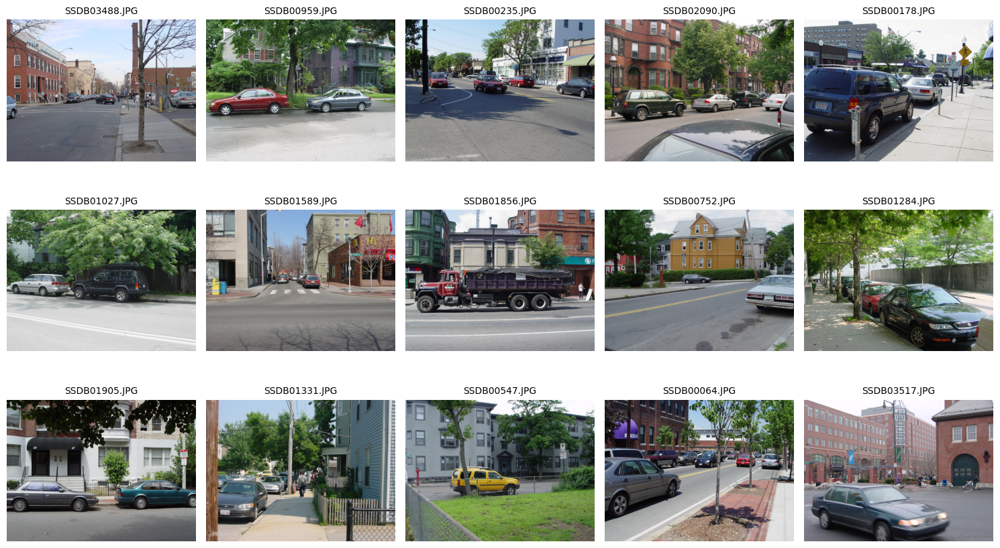

In [19]:
display_random_images(IMAGES_DIR, num_images=15, images_per_row=5)

## 4. MLTables generation

In [20]:
# We'll copy each JSONL file within its related MLTable folder
training_mltable_path = os.path.join(IMAGES_DIR, "training-mltable-folder")
validation_mltable_path = os.path.join(IMAGES_DIR, "validation-mltable-folder")

# First, let's create the folders if they don't exist
os.makedirs(training_mltable_path, exist_ok=True)
os.makedirs(validation_mltable_path, exist_ok=True)

# Training: 80%, validation: 20%
train_validation_ratio = 4

# Path to the training and validation files
train_annotations_file = os.path.join(training_mltable_path,
                                      "train_jsonl.jsonl")
validation_annotations_file = os.path.join(validation_mltable_path,
                                           "val_jsonl.jsonl")

In [23]:
shutil.copy(os.path.join(LABELS_DIR, "train_jsonl.jsonl"),
            train_annotations_file)
!ls $train_annotations_file -lh

-rwxrwxrwx 1 root root 504K Feb 12 08:15 images_segmentation/training-mltable-folder/train_jsonl.jsonl


In [24]:
shutil.copy(os.path.join(LABELS_DIR, "val_jsonl.jsonl"),
            validation_annotations_file)
!ls $validation_annotations_file -lh

-rwxrwxrwx 1 root root 91K Feb 12 08:15 images_segmentation/validation-mltable-folder/val_jsonl.jsonl


In [25]:
# Create and save train mltable
train_mltable_file_contents = create_ml_table_file(
    os.path.basename(train_annotations_file))
save_ml_table_file(training_mltable_path, train_mltable_file_contents)

# Save train and validation mltable
validation_mltable_file_contents = create_ml_table_file(
    os.path.basename(validation_annotations_file))
save_ml_table_file(validation_mltable_path, validation_mltable_file_contents)

In [26]:
# Training MLTable defined locally, with local data to be uploaded
my_training_data_input = Input(type=AssetTypes.MLTABLE,
                               path=training_mltable_path)

# Validation MLTable defined locally, with local data to be uploaded
my_validation_data_input = Input(type=AssetTypes.MLTABLE,
                                 path=validation_mltable_path)

In [27]:
my_training_data_input, my_validation_data_input

({'type': 'mltable', 'path': 'images_segmentation/training-mltable-folder'},
 {'type': 'mltable', 'path': 'images_segmentation/validation-mltable-folder'})

## 5. Azure ML

In [18]:
# Azure ML experimentation job name
exp_name = "street-view-automl-instance-segmentation-job"

In [19]:
# Azure ML client
credential = DefaultAzureCredential()

ml_client = MLClient.from_config(credential=credential)

Found the config file in: /config.json


## 6. GPU cluster

The **Standard_NC4as_T4_v3** is an **Azure GPU-optimized virtual machine** from the NCas T4 v3 series. Here's what characterizes this VM:
- GPU: 1x NVIDIA Tesla T4 GPU
- 16 GB GPU memory
- Turing architecture with Tensor Cores
- Excellent for inference workloads and light training tasks

In [30]:
# Creating or using the Azure ML GPU cluster
compute_name = "gpu-cluster"

try:
    compute = ml_client.compute.get(compute_name)
    print(f"✅ Found existing compute cluster '{compute_name}'")

except ResourceNotFoundError:
    print(f"🛠️ Creating new compute cluster '{compute_name}'...")
    compute_config = AmlCompute(
        name=compute_name,
        size="Standard_NC4as_T4_v3",  # GPU compute cluster
        idle_time_before_scale_down=1200,  # 20 minutes in seconds
        min_instances=0,
        max_instances=4,
        tier="dedicated",  # or "low_priority" for cost savings
    )
    
    ml_client.compute.begin_create_or_update(compute_config).wait()
    print(f"✅ Done. Compute cluster '{compute_name}' created successfully!")

✅ Found existing compute cluster 'gpu-cluster'


In [31]:
compute_details = ml_client.compute.get(compute_name)

print(f"✅ Compute name: {compute_details.name}")
print(f"🔧 Compute type: {compute_details.type}")
print(f"📦 VM size: {compute_details.size}")
print(f"📉 Min instances: {compute_details.min_instances}")
print(f"📈 Max instances: {compute_details.max_instances}")
print(f"⏳ Idle time before scale down: {compute_details.idle_time_before_scale_down:.0f} seconds")
print(f"📍 Location: {compute_details.location}")
print(f"📅 Provisioning state: {compute_details.provisioning_state}")

✅ Compute name: gpu-cluster
🔧 Compute type: amlcompute
📦 VM size: Standard_NC16as_T4_v3
📉 Min instances: 0
📈 Max instances: 4
⏳ Idle time before scale down: 1200 seconds
📍 Location: eastus
📅 Provisioning state: Succeeded


## 7. Uploading images to Azure ML

In [32]:
ws = Workspace.from_config()

In [33]:
default_ds = ws.get_default_datastore()

In [34]:
container_name = "streetimagestore"  # Do not change (name is used in the jsonl labels files)

In [35]:
default_ds.blob_service.create_container(container_name)

try:
    imagestore = Datastore.get(ws, container_name, tags=tags)

except Exception:
    imagestore = Datastore.register_azure_blob_container(
        workspace=ws,
        datastore_name=container_name,
        account_name=default_ds.account_name,
        container_name=container_name,
        account_key=default_ds.account_key)

In [36]:
dsname = "streetview_automl_images_dataset"

In [37]:
dataset = Dataset.File.upload_directory(
    src_dir=IMAGES_DIR,
    target=(imagestore, 'aml_images'),
    overwrite=True,
    show_progress=False,
)

dataset.register(workspace=ws, name=dsname)

Message: [NOT_SUPPORTED_API_USE_ATTEMPT] The [_get_steps] API has been deprecated and is no longer supported
Payload: {"pid": 24740, "MLTableVersion": "1.6.1", "rslex_version": "2.22.5", "api_name": "_get_steps", "version": "5.1.6"}


{
  "definition": "EnginelessDataflow:\n---\ntype: mltable\npaths:\n  - pattern: \"azureml://subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01/datastores/streetimagestore/paths/aml_images\"\nmetadata:\n  infer_column_types: \"False\"\n",
  "registration": {
    "id": "254906ed-1111-40bc-862f-f0982cdcecba",
    "name": "streetview_automl_images_dataset",
    "version": 1,
    "workspace": "Workspace.create(name='amlsms01', subscription_id='e7855339-6cf4-45bb-981e-2f61fcd551ad', resource_group='amls')"
  }
}

In [38]:
registered_dataset = Dataset.get_by_name(ws, dsname)
print(f"🗂️ Dataset registered: {registered_dataset.name}")

🗂️ Dataset registered: streetview_automl_images_dataset


In [39]:
dataset = Dataset.File.upload_directory(
    src_dir=LABELS_DIR,
    target=(default_ds, "labeled_image_files"),
    overwrite=True,
    show_progress=False,
)

In [40]:
train_image_dataset = Dataset.Tabular.from_json_lines_files(
    path=(default_ds, "labeled_image_files/train_jsonl.jsonl"),
    set_column_types={"image_url": DataType.to_stream(imagestore.workspace)}
)

In [41]:
train_image_dataset.register(ws,
                             "training_street_images",
                             create_new_version=True,
                             tags=tags)

Message: [NOT_SUPPORTED_API_USE_ATTEMPT] The [_get_steps] API has been deprecated and is no longer supported
Payload: {"pid": 24740, "MLTableVersion": "1.6.1", "rslex_version": "2.22.5", "api_name": "_get_steps", "version": "5.1.6"}


{
  "definition": "EnginelessDataflow:\n---\ntype: mltable\npaths:\n  - pattern: \"azureml://subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01/datastores/workspaceblobstore/paths/labeled_image_files/train_jsonl.jsonl\"\ntransformations:\n  - read_json_lines:\n      path_column: Path\n      invalid_lines: error\n      encoding: utf8\n      include_path_column: false\n      partition_size: 20971520\n  - convert_column_types:\n      - columns: image_url\n        column_type:\n          stream_info:\n            subscription: e7855339-6cf4-45bb-981e-2f61fcd551ad\n            resource_group: amls\n            workspace_name: amlsms01\n            escaped: false\nmetadata:\n  infer_column_types: \"False\"\n",
  "registration": {
    "id": "b136cc1a-7810-4fc9-8690-4d562cf46369",
    "name": "training_street_images",
    "version": 1,
    "tags": {
      "cloud provider": "Microsoft Azure",
      "data source": "https://www.researchgate.net/publication/

In [42]:
test_image_dataset = Dataset.Tabular.from_json_lines_files(
    path=(default_ds, "labeled_image_files/val_jsonl.jsonl"),
    set_column_types={"image_url": DataType.to_stream(imagestore.workspace)})

In [43]:
test_image_dataset.register(ws,
                            "validating_street_images",
                            create_new_version=True,
                            tags=tags)

Message: [NOT_SUPPORTED_API_USE_ATTEMPT] The [_get_steps] API has been deprecated and is no longer supported
Payload: {"pid": 24740, "MLTableVersion": "1.6.1", "rslex_version": "2.22.5", "api_name": "_get_steps", "version": "5.1.6"}


{
  "definition": "EnginelessDataflow:\n---\ntype: mltable\npaths:\n  - pattern: \"azureml://subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01/datastores/workspaceblobstore/paths/labeled_image_files/val_jsonl.jsonl\"\ntransformations:\n  - read_json_lines:\n      path_column: Path\n      invalid_lines: error\n      encoding: utf8\n      include_path_column: false\n      partition_size: 20971520\n  - convert_column_types:\n      - columns: image_url\n        column_type:\n          stream_info:\n            subscription: e7855339-6cf4-45bb-981e-2f61fcd551ad\n            resource_group: amls\n            workspace_name: amlsms01\n            escaped: false\nmetadata:\n  infer_column_types: \"False\"\n",
  "registration": {
    "id": "7319993b-1090-4f8c-8478-88d60c4185ea",
    "name": "validating_street_images",
    "version": 1,
    "tags": {
      "cloud provider": "Microsoft Azure",
      "data source": "https://www.researchgate.net/publication/

In [44]:
data_asset = ml_client.data.get("training_street_images", version="1")

tbl = mltable.load(f'azureml:/{data_asset.id}')
df_train = tbl.to_pandas_dataframe()
df_train['car_objects'] = df_train['label'].apply(
    lambda x: sum(1 for item in x if item['label'] == 'car'))
df_train['pedestrian_objects'] = df_train['label'].apply(
    lambda x: sum(1 for item in x if item['label'] == 'pedestrian'))
df_train['total_of_objects'] = df_train['car_objects'] + df_train[
    'pedestrian_objects']
df_train

,image_url,label,label_confidence,image_height,image_width,car_objects,pedestrian_objects,total_of_objects
0,streetimagestore/aml_images/SSDB01744.JPG,"[{'label': 'pedestrian', 'isCrowd': False, 'po...",[1.0],960,1280,0,1,1
1,streetimagestore/aml_images/SSDB02068.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0, 1.0, 1.0]",960,1280,3,1,4
2,streetimagestore/aml_images/SSDB00327.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0, 1.0, 1.0, 1.0]",960,1280,3,2,5
3,streetimagestore/aml_images/SSDB02824.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0, 1.0]",960,1280,3,0,3
4,streetimagestore/aml_images/SSDB00615.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...",[1.0],960,1280,1,0,1
...,...,...,...,...,...,...,...,...
495,streetimagestore/aml_images/SSDB00908.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0]",960,1280,2,0,2
496,streetimagestore/aml_images/SSDB02489.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...",[1.0],960,1280,1,0,1
497,streetimagestore/aml_images/SSDB03057.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0]",960,1280,2,0,2
498,streetimagestore/aml_images/SSDB03135.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0, 1.0]",960,1280,3,0,3


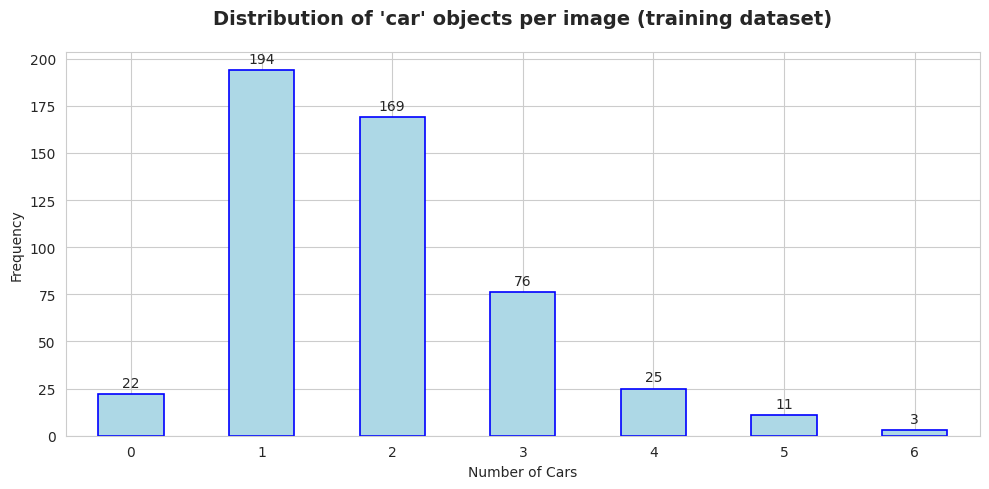

In [45]:
sns.set_style("whitegrid")
plt.figure(figsize=(10, 5))

car_counts = df_train['car_objects'].value_counts().sort_index()
ax = car_counts.plot.bar(color='lightblue', edgecolor='blue', linewidth=1.2)
plt.title("Distribution of 'car' objects per image (training dataset)",
          fontsize=14,
          fontweight='bold',
          pad=20)
plt.xlabel('Number of Cars', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

for container in ax.containers:
    ax.bar_label(container, fontsize=10, padding=3)

plt.tight_layout()
plt.show()

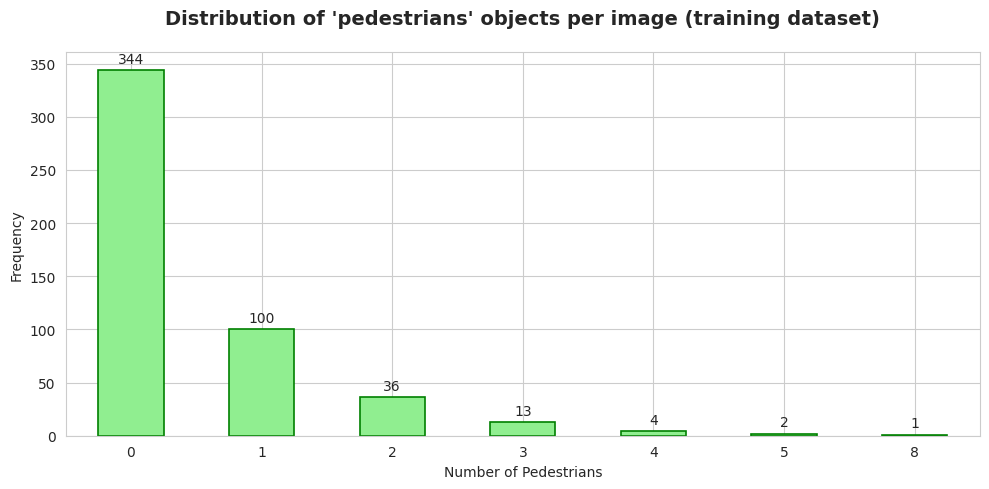

In [46]:
sns.set_style("whitegrid")
plt.figure(figsize=(10, 5))

car_counts = df_train['pedestrian_objects'].value_counts().sort_index()
ax = car_counts.plot.bar(color='lightgreen', edgecolor='green', linewidth=1.2)
plt.title("Distribution of 'pedestrians' objects per image (training dataset)",
          fontsize=14,
          fontweight='bold',
          pad=20)
plt.xlabel('Number of Pedestrians', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

for container in ax.containers:
    ax.bar_label(container, fontsize=10, padding=3)

plt.tight_layout()
plt.show()

In [47]:
data_asset = ml_client.data.get("validating_street_images", version="1")

tbl = mltable.load(f'azureml:/{data_asset.id}')
df_val = tbl.to_pandas_dataframe()
df_val['car_objects'] = df_val['label'].apply(
    lambda x: sum(1 for item in x if item['label'] == 'car'))
df_val['pedestrian_objects'] = df_val['label'].apply(
    lambda x: sum(1 for item in x if item['label'] == 'pedestrian'))
df_val[
    'total_of_objects'] = df_val['car_objects'] + df_val['pedestrian_objects']
df_val

,image_url,label,label_confidence,image_height,image_width,car_objects,pedestrian_objects,total_of_objects
0,streetimagestore/aml_images/SSDB02673.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...",[1.0],960,1280,1,0,1
1,streetimagestore/aml_images/SSDB02407.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0]",960,1280,2,0,2
2,streetimagestore/aml_images/SSDB00038.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0, 1.0, 1.0, 1.0]",960,1280,2,3,5
3,streetimagestore/aml_images/SSDB03294.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0, 1.0]",960,1280,1,2,3
4,streetimagestore/aml_images/SSDB00958.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0]",960,1280,2,0,2
...,...,...,...,...,...,...,...,...
95,streetimagestore/aml_images/SSDB01565.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0]",960,1280,2,0,2
96,streetimagestore/aml_images/SSDB00616.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0]",960,1280,2,0,2
97,streetimagestore/aml_images/SSDB02480.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...","[1.0, 1.0]",960,1280,2,0,2
98,streetimagestore/aml_images/SSDB02917.JPG,"[{'label': 'car', 'isCrowd': False, 'polygon':...",[1.0],960,1280,1,0,1


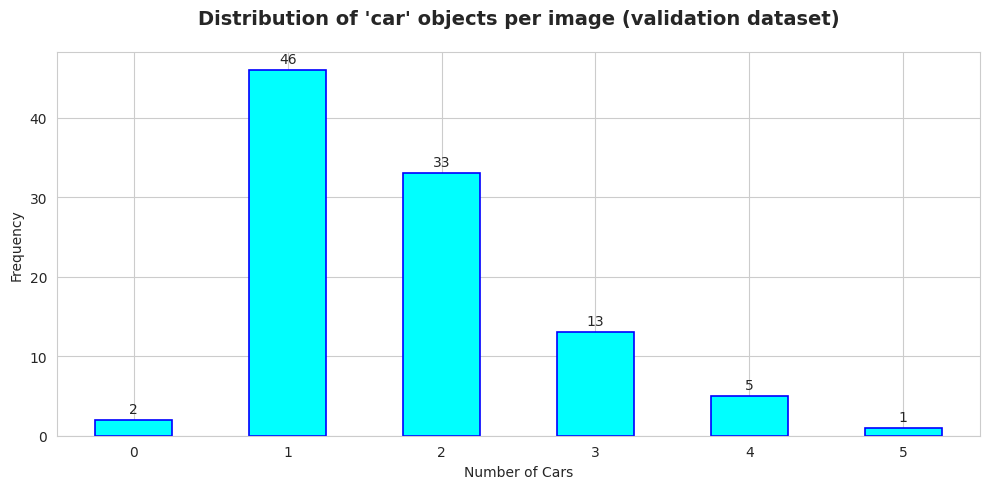

In [48]:
sns.set_style("whitegrid")
plt.figure(figsize=(10, 5))

car_counts = df_val['car_objects'].value_counts().sort_index()
ax = car_counts.plot.bar(color='cyan', edgecolor='blue', linewidth=1.2)
plt.title("Distribution of 'car' objects per image (validation dataset)",
          fontsize=14,
          fontweight='bold',
          pad=20)
plt.xlabel('Number of Cars', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

for container in ax.containers:
    ax.bar_label(container, fontsize=10, padding=3)

plt.tight_layout()
plt.show()

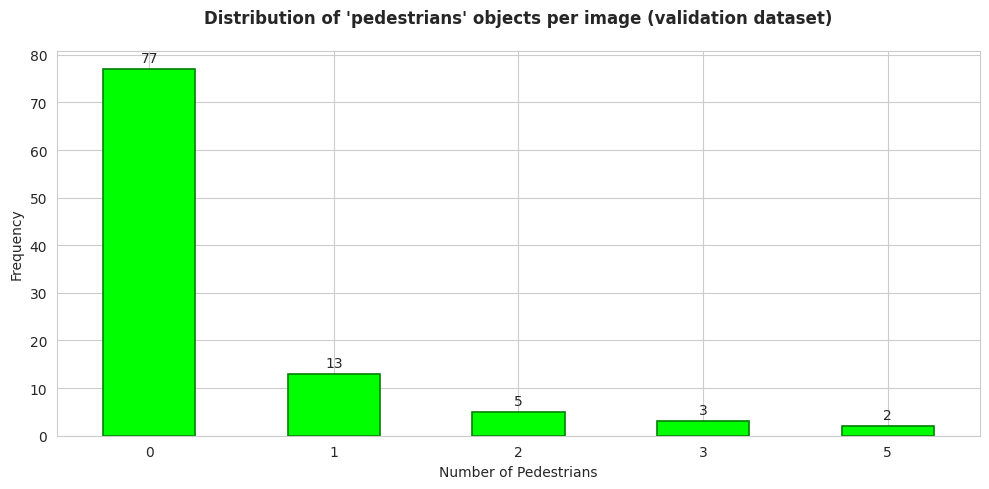

In [49]:
sns.set_style("whitegrid")
plt.figure(figsize=(10, 5))

car_counts = df_val['pedestrian_objects'].value_counts().sort_index()
ax = car_counts.plot.bar(color='lime', edgecolor='green', linewidth=1.2)
plt.title(
    "Distribution of 'pedestrians' objects per image (validation dataset)",
    fontsize=12,
    fontweight='bold',
    pad=20)
plt.xlabel('Number of Pedestrians', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

for container in ax.containers:
    ax.bar_label(container, fontsize=10, padding=3)

plt.tight_layout()
plt.show()

In [50]:
my_training_data_input, my_validation_data_input

({'type': 'mltable', 'path': 'images_segmentation/training-mltable-folder'},
 {'type': 'mltable', 'path': 'images_segmentation/validation-mltable-folder'})

In [51]:
with open(os.path.join(IMAGES_DIR, "training-mltable-folder", "MLTable"),
          'r') as f:
    print(f.read())

paths:
  - file: ./train_jsonl.jsonl
transformations:
  - read_json_lines:
        encoding: utf8
        invalid_lines: error
        include_path_column: false
  - convert_column_types:
      - columns: image_url
        column_type: stream_info


In [52]:
with open(os.path.join(IMAGES_DIR, "validation-mltable-folder", "MLTable"),
          'r') as f:
    print(f.read())

paths:
  - file: ./val_jsonl.jsonl
transformations:
  - read_json_lines:
        encoding: utf8
        invalid_lines: error
        include_path_column: false
  - convert_column_types:
      - columns: image_url
        column_type: stream_info


![Example](img/ds1.jpg)
<br>
![Example](img/ds2.jpg)

## 8. AutoML

AutoML for Images in Azure Machine Learning is an automated machine learning capability that simplifies building computer vision models without requiring deep expertise in ML algorithms. It supports tasks such as:

- Image Classification (multi-class, multi-label)
- Object Detection
- Instance Segmentation (our focus here)

Instance segmentation goes beyond object detection by identifying each object instance and its pixel-level mask within an image. For example, in a photo of multiple cars, it not only detects “car” but also outlines each car separately.

AutoML for instance segmentation in Azure automates the end-to-end process of training and deploying pixel-level object detection models, making advanced vision tasks accessible to data scientists and developers without deep ML expertise.


### 8.1 Single model

In [53]:
model_name = "maskrcnn_resnet18_fpn"

**maskrcnn_resnet18_fpn** is an instance segmentation model available in **Azure AutoML for Computer Vision**. It's one of the lighter variants in the Mask R-CNN family designed for identifying and segmenting individual object instances at the pixel level.

- Speed: ⚡⚡⚡⚡ (Fastest among Mask R-CNN variants)
- Accuracy: ⭐⭐⭐ (Good, but lower than deeper variants)
- Memory: 💾💾 (Lower GPU memory requirements)
- Parameters: ~20-25M parameters (vs ~45M for ResNet50, ~65M for ResNet101)

In [54]:
singlemodel_instance_segmentation_job = automl.image_instance_segmentation(
    compute=compute_name,  # My GPU cluster
    experiment_name=exp_name,  # Azure ML job name
    training_data=my_training_data_input,  # Training data
    validation_data=my_validation_data_input,  # Validation data
    target_column_name="label",  # Target column name
    primary_metric=InstanceSegmentationPrimaryMetrics.MEAN_AVERAGE_PRECISION,  # Metric
    tags=tags,  # Use of descriptive tags (optional)
)

In [55]:
singlemodel_instance_segmentation_job.set_limits(
    max_trials=1,  # Only 1 here in this example.
    timeout_minutes=60, # Timeout in min. Default value is 7 days (max allowed is 60 days)
)

In [56]:
print("Submitting AutoML job")
returned_job = ml_client.jobs.create_or_update(
    singlemodel_instance_segmentation_job)
print("✅ Done")

Submitting AutoML job


Uploading training-mltable-folder (0.52 MBs): 100%|██████████| 515604/515604 [00:00<00:00, 7831704.61it/s]


Uploading validation-mltable-folder (0.09 MBs): 100%|██████████| 93202/93202 [00:00<00:00, 2642048.67it/s]




✅ Done


![Example](img/job1.jpg)

In [57]:
job = ml_client.jobs.get(returned_job.name)
emoji = status_emojis.get(job.status, "ℹ️")
print(f"{emoji} Job status '{returned_job.name}': {job.status.upper()}")

⏳ Job status 'coral_horse_swcrw8qyrr': NOTSTARTED


In [58]:
ml_client.jobs.get(returned_job.name)

Experiment,Name,Type,Status,Details Page
street-view-automl-instance-segmentation-job,coral_horse_swcrw8qyrr,automl,NotStarted,Link to Azure Machine Learning studio


In [59]:
job = ml_client.jobs.get(returned_job.name)
emoji = status_emojis.get(job.status, "ℹ️")
print(f"{emoji} Job status '{returned_job.name}': {job.status.upper()}")

🔄 Job status 'coral_horse_swcrw8qyrr': RUNNING


![Example](img/job2.jpg)

<img src="img/cluster1.jpg">

In [68]:
job = ml_client.jobs.get(returned_job.name)
emoji = status_emojis.get(job.status, "ℹ️")
print(f"{emoji} Job status '{returned_job.name}': {job.status.upper()}")

✅ Job status 'coral_horse_swcrw8qyrr': COMPLETED


In [69]:
print(f"🆔 Job Name: {job.name}")
print(f"💬 Display Name: {job.display_name}")
print(f"🚦 Status: {job.status}")
print(f"🔬 Experiment Name: {job.experiment_name}")
print(f"🎯 Job Type: {job.type}")
print(f"🕐 Created: {job.creation_context.created_at}")
print(f"⏱️ Last Modified: {job.creation_context.last_modified_at}\n")
print(f"📤 Outputs: {job.outputs}")

🆔 Job Name: coral_horse_swcrw8qyrr
💬 Display Name: coral_horse_swcrw8qyrr
🚦 Status: Completed
🔬 Experiment Name: street-view-automl-instance-segmentation-job
🎯 Job Type: automl
🕐 Created: 2026-02-12 08:21:09.569801+00:00
⏱️ Last Modified: None

📤 Outputs: {}


![Example](img/automl1.jpg)

In [70]:
get_job_status()


📋 JOB PROPERTIES SUMMARY coral_horse_swcrw8qyrr

🌟 Key Settings:
  📊 primary_metric: mean_average_precision
  🖥️ target: gpu-cluster
  🔢 num_iterations: 1
  🏋️ training_type: TrainFull

⚙️  AutoML Configuration:
  • Task Type: image-instance-segmentation
  • Iterations: 1
  • Max Concurrent: 1
  • Timeout (min): 60
  • Early Stopping: True
  • Early Stop After: 20
  • VM Type: Standard_NC16as_T4_v3
  • VM Priority: dedicated

📦 Data Configuration:
  • Type: MLTable
  • Training Data: ✅
  • Validation Data: ✅
  • Test Data: ❌



In [71]:
job_single_id = returned_job.name

print(f"🤖 AutoML job is: '{job_single_id}'")

🤖 AutoML job is: 'coral_horse_swcrw8qyrr'


![Example](img/email1.jpg)

### 8.2 Manual hyperparameter sweeping for your model
When training computer vision models, model performance depends heavily on the hyperparameter values selected. Often, you might want to tune the hyperparameters to get optimal performance. For computer vision tasks, you can sweep hyperparameters to find the optimal settings for your model. This feature applies the hyperparameter tuning capabilities in Azure Machine Learning.

> https://learn.microsoft.com/en-us/azure/machine-learning/how-to-tune-hyperparameters?view=azureml-api-2

In [72]:
ht_instance_segmentation_job = automl.image_instance_segmentation(
    compute=compute_name,  # Compute instance
    experiment_name=exp_name,  # Experiment name
    training_data=my_training_data_input,  # Training images
    validation_data=my_validation_data_input,  # Validation images
    target_column_name="label",  # Target to predict
    primary_metric=InstanceSegmentationPrimaryMetrics.MEAN_AVERAGE_PRECISION,  # Metric
    tags=tags,  # Descriptive tags (optional)
)

In [ ]:
# Set limits
ht_instance_segmentation_job.set_limits(
    max_trials=8,  # Sets the maximum number of trials that AutoML will try.
    max_concurrent_trials=4,  # Sets the maximum number of trials that can run in parallel.
    timeout_minutes=120,  #  Default value is 7 days (max allowed is 60 days)
)

ht_instance_segmentation_job.set_training_parameters(
    early_stopping=True,  # Enables the early stopping feature during training.
    evaluation_frequency=1  # How often (in epochs or iterations) the model’s performance is evaluated on the validation set during training.
)

# Configure sweep settings
ht_instance_segmentation_job.set_sweep(
    sampling_algorithm="random",  # values are: random, grid, bayesian
    early_termination=BanditPolicy(
        evaluation_interval=2,  # The frequency (in number of iterations or epochs) at which the policy checks the performance of each trial.
        slack_factor=0.2,  # Determines how much worse a trial can perform compared to the best trial before being terminated.
        delay_evaluation=6  # Delays the start of early termination checks until after 6 iterations.
    ),
)

In [74]:
# Define search space
ht_instance_segmentation_job.extend_search_space([
    SearchSpace(
        model_name=Choice(["maskrcnn_resnet50_fpn", "maskrcnn_resnet101_fpn"]),  # Models to use
        learning_rate=Uniform(0.0001, 0.001),  # Randomly sampled from a uniform range. Controls the step size during optimization.
        optimizer=Choice(["sgd", "adam", "adamw"]),  # Chooses the optimization algorithm to update model weights.
        min_size=Choice([600, 800]),  # Selects the minimum input size for the model from [600, 800].
        number_of_epochs=Choice([15, 30, 50]),  # Picks the number of full training passes over the dataset from [15, 30, 50].
        warmup_cosine_lr_warmup_epochs=Choice([0, 3]),  # Adding warmup steps can stabilize training
    ),
])

In [75]:
print("Submitting AutoML job")
returned_job = ml_client.jobs.create_or_update(ht_instance_segmentation_job)
print("✅ Done")

Submitting AutoML job
✅ Done


In [79]:
job = ml_client.jobs.get(returned_job.name)
emoji = status_emojis.get(job.status, "ℹ️")
print(f"{emoji} Job status '{returned_job.name}': {job.status.upper()}")

🔄 Job status 'salmon_nail_3701hgnjxr': RUNNING


In [80]:
ml_client.jobs.get(returned_job.name)

Experiment,Name,Type,Status,Details Page
street-view-automl-instance-segmentation-job,salmon_nail_3701hgnjxr,automl,Running,Link to Azure Machine Learning studio


In [24]:
job = ml_client.jobs.get('salmon_nail_3701hgnjxr')
emoji = status_emojis.get(job.status, "ℹ️")
print(f"{emoji} Job status '{job.name}': {job.status.upper()}")

✅ Job status 'salmon_nail_3701hgnjxr': COMPLETED


In [25]:
print(f"🆔 Job Name: {job.name}")
print(f"💬 Display Name: {job.display_name}")
print(f"🚦 Status: {job.status}")
print(f"🔬 Experiment Name: {job.experiment_name}")
print(f"🎯 Job Type: {job.type}")
print(f"🕐 Created: {job.creation_context.created_at}")
print(f"⏱️ Last Modified: {job.creation_context.last_modified_at}\n")
print(f"📤 Outputs: {job.outputs}")

🆔 Job Name: salmon_nail_3701hgnjxr
💬 Display Name: salmon_nail_3701hgnjxr
🚦 Status: Completed
🔬 Experiment Name: street-view-automl-instance-segmentation-job
🎯 Job Type: automl
🕐 Created: 2026-02-12 09:08:17.340950+00:00
⏱️ Last Modified: None

📤 Outputs: {}


In [27]:
returned_job = ml_client.jobs.get('salmon_nail_3701hgnjxr')
get_job_status()


📋 JOB PROPERTIES SUMMARY salmon_nail_3701hgnjxr

🌟 Key Settings:
  📊 primary_metric: mean_average_precision
  🖥️ target: gpu-cluster
  🔢 num_iterations: 1
  🏋️ training_type: TrainFull

⚙️  AutoML Configuration:
  • Task Type: image-instance-segmentation
  • Iterations: 1
  • Max Concurrent: 1
  • Timeout (min): 10080
  • Early Stopping: True
  • Early Stop After: 20
  • VM Type: Standard_NC16as_T4_v3
  • VM Priority: dedicated

📦 Data Configuration:
  • Type: MLTable
  • Training Data: ✅
  • Validation Data: ✅
  • Test Data: ❌



In [28]:
job_ht_id = returned_job.name

print(f"🤖 AutoML job is: '{job_ht_id}'")

🤖 AutoML job is: 'salmon_nail_3701hgnjxr'


![Example](img/automl2.jpg)

![Example](img/automl3.jpg)

### 8.3 Copilot mode (all models will be evaluated)

### Available models

### maskrcnn_resnet18_fpn ⚡

- **Backbone**: ResNet-18 (18 layers)
- **Speed**: ⚡⚡⚡⚡⚡ Fastest
- **Accuracy**: ⭐⭐⭐ Good
- **Parameters**: ~12M (Lightest)
- **Best for**: Real-time applications, edge devices, quick prototyping
- **Trade-off**: Lower accuracy but excellent speed and low memory usage

### maskrcnn_resnet34_fpn 🚀

- **Backbone**: ResNet-34 (34 layers)
- **Speed**: ⚡⚡⚡⚡ Very Fast
- **Accuracy**: ⭐⭐⭐⭐ Very Good
- **Parameters**: ~23M
- **Best for**: Balanced performance, production deployments with moderate resources
- **Trade-off**: Sweet spot between speed and accuracy

### maskrcnn_resnet50_fpn 🎯

- **Backbone**: ResNet-50 (50 layers)
- **Speed**: ⚡⚡⚡ Fast
- **Accuracy**: ⭐⭐⭐⭐⭐ Excellent
- **Parameters**: ~44M (Most Popular)
- **Best for**: Most common choice - great balance of accuracy and performance
- **Trade-off**: Industry standard, widely used and well-tested

### maskrcnn_resnet101_fpn 💪

- **Backbone**: ResNet-101 (101 layers)
- **Speed**: ⚡⚡ Moderate
- **Accuracy**: ⭐⭐⭐⭐⭐⭐ Superior
- **Parameters**: ~63M
- **Best for**: High-accuracy requirements, complex scenes, research
- **Trade-off**: Higher computational cost but better feature extraction

### maskrcnn_resnet152_fpn 🏆

- **Backbone**: ResNet-152 (152 layers)
- **Speed**: ⚡ Slower
- **Accuracy**: ⭐⭐⭐⭐⭐⭐⭐ Best
- **Parameters**: ~78M (Heaviest)
- **Best for**: Maximum accuracy, challenging datasets, when computational resources aren't a constraint
- **Trade-off**: Highest accuracy but slowest inference and highest memory usage

In [121]:
copilot_instance_segmentation_job = automl.image_instance_segmentation(
    compute=compute_name,  # GPU compute cluster
    experiment_name=exp_name,  # Experimentation name 
    training_data=my_training_data_input,  # Training images
    validation_data=my_validation_data_input,  # Validation images
    target_column_name="label",  # Target
    primary_metric="MeanAveragePrecision",  # Metric
    tags=tags,
)

copilot_instance_segmentation_job.set_limits(
    max_trials=8,  # Sets the maximum number of trials that AutoML will try.
    max_concurrent_trials=4,  # Sets the maximum number of trials that can run in parallel.
    #timeout_minutes=420,  # Default value is 7 days (max allowed is 60 days)
)

In [122]:
print("Submitting AutoML job")
returned_job = ml_client.jobs.create_or_update(
    copilot_instance_segmentation_job)
print("✅ Done")

Submitting AutoML job
✅ Done


In [123]:
print(f"✅ Created job: {returned_job}")

✅ Created job: compute: azureml:gpucluster
creation_context:
  created_at: '2025-11-12T18:09:18.002951+00:00'
  created_by: Serge Retkowsky
  created_by_type: User
display_name: olden_jewel_9s9kp6pxcq
experiment_name: street-view-automl-instance-segmentation-job-2025
id: azureml:/subscriptions/b8acd8e6-3841-4717-8469-82e36dad9ae5/resourceGroups/azureml-testing-rg/providers/Microsoft.MachineLearningServices/workspaces/azuremltest/jobs/olden_jewel_9s9kp6pxcq
limits:
  max_concurrent_trials: 4
  max_trials: 8
  timeout_minutes: 10080
log_verbosity: info
name: olden_jewel_9s9kp6pxcq
outputs: {}
primary_metric: mean_average_precision
properties: {}
queue_settings:
  job_tier: 'null'
resources:
  instance_count: 1
  shm_size: 2g
services:
  Studio:
    endpoint: https://ml.azure.com/runs/olden_jewel_9s9kp6pxcq?wsid=/subscriptions/b8acd8e6-3841-4717-8469-82e36dad9ae5/resourcegroups/azureml-testing-rg/workspaces/azuremltest&tid=16b3c013-d300-468d-ac64-7eda0820b6d3
  Tracking:
    endpoint: azu

In [128]:
job = ml_client.jobs.get(returned_job.name)
emoji = status_emojis.get(job.status, "ℹ️")
print(f"{emoji} Job status '{returned_job.name}': {job.status.upper()}")

🔄 Job status 'olden_jewel_9s9kp6pxcq': RUNNING


In [129]:
ml_client.jobs.get(returned_job.name)

Experiment,Name,Type,Status,Details Page
street-view-automl-instance-segmentation-job-2025,olden_jewel_9s9kp6pxcq,automl,Running,Link to Azure Machine Learning studio


In [141]:
job = ml_client.jobs.get(returned_job.name)
emoji = status_emojis.get(job.status, "ℹ️")
print(f"{emoji} Job status '{returned_job.name}': {job.status.upper()}")

✅ Job status 'olden_jewel_9s9kp6pxcq': COMPLETED


In [142]:
print(f"🆔 Job Name: {job.name}")
print(f"💬 Display Name: {job.display_name}")
print(f"🚦 Status: {job.status}")
print(f"🔬 Experiment Name: {job.experiment_name}")
print(f"🎯 Job Type: {job.type}")
print(f"🕐 Created: {job.creation_context.created_at}")
print(f"⏱️ Last Modified: {job.creation_context.last_modified_at}\n")
print(f"📤 Outputs: {job.outputs}")

🆔 Job Name: olden_jewel_9s9kp6pxcq
💬 Display Name: olden_jewel_9s9kp6pxcq
🚦 Status: Completed
🔬 Experiment Name: street-view-automl-instance-segmentation-job-2025
🎯 Job Type: automl
🕐 Created: 2025-11-12 18:09:18.002951+00:00
⏱️ Last Modified: None

📤 Outputs: {}


In [143]:
get_job_status()


📋 JOB PROPERTIES SUMMARY olden_jewel_9s9kp6pxcq

🌟 Key Settings:
  📊 primary_metric: mean_average_precision
  🖥️ target: gpucluster
  🔢 num_iterations: 8
  🏋️ training_type: TrainFull

⚙️  AutoML Configuration:
  • Task Type: image-instance-segmentation
  • Iterations: 8
  • Max Concurrent: 4
  • Timeout (min): 10080
  • Early Stopping: True
  • Early Stop After: 20
  • VM Type: Standard_NC4as_T4_v3
  • VM Priority: dedicated

📦 Data Configuration:
  • Type: MLTable
  • Training Data: ✅
  • Validation Data: ✅
  • Test Data: ❌



In [144]:
job_copilot_id = returned_job.name

print(f"🤖 AutoML job is: '{job_copilot_id}'")

🤖 AutoML job is: 'olden_jewel_9s9kp6pxcq'


![Example](img/automl4.jpg)

## 9. MLFlow

In [29]:
# Get the tracking URI from MLClient
MLFLOW_TRACKING_URI = ml_client.workspaces.get(
    name=ml_client.workspace_name).mlflow_tracking_uri

#print(f"🧪 MLFlow tracking URI: {MLFLOW_TRACKING_URI}")

In [30]:
# Set the MLFLOW TRACKING URI
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

#print(f"🧪 Current tracking URI: {mlflow.get_tracking_uri()}")

In [31]:
# Initialize MLFlow client
mlflow_client = MlflowClient()
mlflow_client

### For job1 (single job)

In [33]:
job_name = 'coral_horse_swcrw8qyrr'

In [34]:
# Get the parent run
mlflow_parent_run = mlflow_client.get_run(job_name)

In [35]:
# Print parent run tags
print("🏷️ Parent run tags:\n")
print(mlflow_parent_run.data.tags)

🏷️ Parent run tags:

{'cloud provider': 'Microsoft Azure', 'data source': 'https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images', 'department': 'Data science', 'topic': 'Images instance segmentation', 'tools': 'AutoML for images Azure ML', 'usecase': 'Street instance segmentation 2025', 'tags': 'car, pedestrian', 'version': '1.0', 'model_explain_run': 'best_run', 'is_gpu': 'True', 'pipeline_id_000': 'UnkownPipelineId', 'score_000': '0.86919', 'predicted_cost_000': '0', 'fit_time_000': 'NaN', 'training_percent_000': '0', 'iteration_000': '0', 'run_preprocessor_000': '', 'run_algorithm_000': '', 'automl_best_child_run_id': 'coral_horse_swcrw8qyrr_HD_0', 'mlflow.rootRunId': 'coral_horse_swcrw8qyrr', 'mlflow.runName': 'coral_horse_swcrw8qyrr', 'mlflow.user': 'Marcin Szeliga'}


In [36]:
best_child_run_id = mlflow_parent_run.data.tags["automl_best_child_run_id"]
print(f"🏆 Found 'best child' run id:\n{best_child_run_id}")

🏆 Found 'best child' run id:
coral_horse_swcrw8qyrr_HD_0


In [37]:
best_run = mlflow_client.get_run(best_child_run_id)
print(f"🏆 Best child run:\n{best_run}")

🏆 Best child run:
<Run: data=<RunData: metrics={'log_loss': 0.4193896790294303,
 'log_loss_train': 0.28557031307688335,
 'mean_average_precision': 0.85228,
 'precision': 0.56524,
 'recall': 0.94481}, params={}, tags={'hyperparameters': '{"ignored_argument": 0}',
 'mlflow.parentRunId': 'coral_horse_swcrw8qyrr_HD',
 'mlflow.rootRunId': 'coral_horse_swcrw8qyrr',
 'mlflow.runName': 'purple_leek_kl6rj5z0',
 'mlflow.source.name': 'hd_image_instance_segmentation_dnn_driver.py',
 'mlflow.source.type': 'JOB',
 'mlflow.user': 'Marcin Szeliga'}>, info=<RunInfo: artifact_uri='azureml://eastus.api.azureml.ms/mlflow/v2.0/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/AMLS/providers/Microsoft.MachineLearningServices/workspaces/amlsms01/experiments/992f215d-9c66-4ab1-a891-8cb4e94da2ad/runs/coral_horse_swcrw8qyrr_HD_0/artifacts', end_time=1770887141258, experiment_id='992f215d-9c66-4ab1-a891-8cb4e94da2ad', lifecycle_stage='active', run_id='coral_horse_swcrw8qyrr_HD_0', run_name='purp

In [38]:
metrics = best_run.data.metrics

print(f"Model Performance Summary for {best_child_run_id}\n")
print(f"🔒 Log Loss (Train)   = {metrics['log_loss_train']:.4f}")
print(f"✅ Precision          = {metrics['precision']:.4f}")
print(f"🔍 Recall             = {metrics['recall']:.4f}")
print(f"🌟 Mean Avg Precision = {metrics['mean_average_precision']:.4f}")

Model Performance Summary for coral_horse_swcrw8qyrr_HD_0

🔒 Log Loss (Train)   = 0.2856
✅ Precision          = 0.5652
🔍 Recall             = 0.9448
🌟 Mean Avg Precision = 0.8523


In [39]:
df_automl = pd.DataFrame([{
    "job_name": job_name,
    "best_child_run_id": best_child_run_id,
    "log_loss_train": metrics["log_loss_train"],
    "precision": metrics["precision"],
    "recall": metrics["recall"],
    "mean_average_precision": metrics["mean_average_precision"]
}])

df_automl

,job_name,best_child_run_id,log_loss_train,precision,recall,mean_average_precision
0,coral_horse_swcrw8qyrr,coral_horse_swcrw8qyrr_HD_0,0.28557,0.56524,0.94481,0.85228


### For job 2

In [40]:
job_name = 'salmon_nail_3701hgnjxr'

In [41]:
mlflow_parent_run = mlflow_client.get_run(job_name)

In [42]:
# Print parent run tags
print("🏷️ Parent run tags:\n")
print(mlflow_parent_run.data.tags)

🏷️ Parent run tags:

{'cloud provider': 'Microsoft Azure', 'data source': 'https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images', 'department': 'Data science', 'topic': 'Images instance segmentation', 'tools': 'AutoML for images Azure ML', 'usecase': 'Street instance segmentation 2025', 'tags': 'car, pedestrian', 'version': '1.0', 'model_explain_run': 'best_run', 'is_gpu': 'True', 'pipeline_id_000': 'UnkownPipelineId', 'score_000': '0.87327', 'predicted_cost_000': '0', 'fit_time_000': 'NaN', 'training_percent_000': '0', 'iteration_000': '0', 'run_preprocessor_000': '', 'run_algorithm_000': '', 'automl_best_child_run_id': 'salmon_nail_3701hgnjxr_HD_7', 'mlflow.rootRunId': 'salmon_nail_3701hgnjxr', 'mlflow.runName': 'salmon_nail_3701hgnjxr', 'mlflow.user': 'Marcin Szeliga'}


In [43]:
best_child_run_id = mlflow_parent_run.data.tags["automl_best_child_run_id"]
print(f"🏆 Found 'best child' run id:\n{best_child_run_id}")

🏆 Found 'best child' run id:
salmon_nail_3701hgnjxr_HD_7


In [44]:
best_run = mlflow_client.get_run(best_child_run_id)
print(f"🏆 Best child run:\n{best_run}")

🏆 Best child run:
<Run: data=<RunData: metrics={'log_loss_train': 0.35350807767073644,
 'mean_average_precision': 0.86707,
 'mean_average_precision_train': 0.90002,
 'precision': 0.50435,
 'precision_train': 0.56972,
 'recall': 0.96645,
 'recall_train': 0.97242}, params={}, tags={'hyperparameters': '{"model": {"learning_rate": 0.0005086427118638611, '
                    '"min_size": 600, "model_name": "maskrcnn_resnet50_fpn", '
                    '"number_of_epochs": 30, "optimizer": "sgd", '
                    '"warmup_cosine_lr_warmup_epochs": 0}}',
 'mlflow.parentRunId': 'salmon_nail_3701hgnjxr_HD',
 'mlflow.rootRunId': 'salmon_nail_3701hgnjxr',
 'mlflow.runName': 'stoic_button_c1jl5cnw',
 'mlflow.source.name': 'hd_image_instance_segmentation_dnn_driver.py',
 'mlflow.source.type': 'JOB',
 'mlflow.user': 'Marcin Szeliga'}>, info=<RunInfo: artifact_uri='azureml://eastus.api.azureml.ms/mlflow/v2.0/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/AMLS/providers/Micro

In [45]:
metrics = best_run.data.metrics

print(f"Model Performance Summary for {best_child_run_id}\n")
print(f"🔒 Log Loss (Train)   = {metrics['log_loss_train']:.4f}")
print(f"✅ Precision          = {metrics['precision']:.4f}")
print(f"🔍 Recall             = {metrics['recall']:.4f}")
print(f"🌟 Mean Avg Precision = {metrics['mean_average_precision']:.4f}")

Model Performance Summary for salmon_nail_3701hgnjxr_HD_7

🔒 Log Loss (Train)   = 0.3535
✅ Precision          = 0.5043
🔍 Recall             = 0.9665
🌟 Mean Avg Precision = 0.8671


In [46]:
new_row = {
    "job_name": job_name,
    "best_child_run_id": best_child_run_id,
    "log_loss_train": metrics["log_loss_train"],
    "precision": metrics["precision"],
    "recall": metrics["recall"],
    "mean_average_precision": metrics["mean_average_precision"]
}

df_automl = pd.concat([df_automl, pd.DataFrame([new_row])], ignore_index=True)
df_automl

,job_name,best_child_run_id,log_loss_train,precision,recall,mean_average_precision
0,coral_horse_swcrw8qyrr,coral_horse_swcrw8qyrr_HD_0,0.285570,0.56524,0.94481,0.85228
1,salmon_nail_3701hgnjxr,salmon_nail_3701hgnjxr_HD_7,0.353508,0.50435,0.96645,0.86707


### For job 3

In [182]:
job_name = job_copilot_id

In [183]:
print(f"Job name: {job_name}")

Job name: olden_jewel_9s9kp6pxcq


In [184]:
mlflow_parent_run = mlflow_client.get_run(job_name)

In [185]:
# Print parent run tags
print("🏷️ Parent run tags:\n")
print(mlflow_parent_run.data.tags)

🏷️ Parent run tags:

{'author': 'Serge Retkowsky', 'cloud provider': 'Microsoft Azure', 'data source': 'https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images', 'date': 'November 2025', 'department': 'Data science', 'topic': 'Images instance segmentation', 'tools': 'AutoML for images Azure ML', 'usecase': 'Street instance segmentation 2025', 'tags': 'car, pedestrian', 'version': '1.0', 'model_explain_run': 'best_run', 'is_gpu': 'True', 'pipeline_id_000': 'UnkownPipelineId', 'score_000': '0.87457', 'predicted_cost_000': '0', 'fit_time_000': 'NaN', 'training_percent_000': '0', 'iteration_000': '0', 'run_preprocessor_000': '', 'run_algorithm_000': '', 'automl_best_child_run_id': 'olden_jewel_9s9kp6pxcq_HD_2', 'mlflow.rootRunId': 'olden_jewel_9s9kp6pxcq', 'mlflow.runName': 'olden_jewel_9s9kp6pxcq', 'mlflow.user': 'Serge Retkowsky'}


In [186]:
best_child_run_id = mlflow_parent_run.data.tags["automl_best_child_run_id"]
print(f"🏆 Found 'best child' run id:\n{best_child_run_id}")

🏆 Found 'best child' run id:
olden_jewel_9s9kp6pxcq_HD_2


In [187]:
best_run = mlflow_client.get_run(best_child_run_id)
print(f"🏆 Best child run:\n{best_run}")

🏆 Best child run:
<Run: data=<RunData: metrics={'log_loss': 0.41215747333679004,
 'log_loss_train': 0.3443757314896036,
 'mean_average_precision': 0.87202,
 'precision': 0.50666,
 'recall': 0.96645}, params={}, tags={'hyperparameters': '{"model": {"learning_rate": 0.0005092319373178185, '
                    '"model_name": "maskrcnn_resnet50_fpn", '
                    '"training_batch_size": 1, "validation_batch_size": 1, '
                    '"weight_decay": 0.00036304634586390436}}',
 'mlflow.parentRunId': 'olden_jewel_9s9kp6pxcq_HD',
 'mlflow.rootRunId': 'olden_jewel_9s9kp6pxcq',
 'mlflow.runName': 'heroic_oregano_l2571c34',
 'mlflow.source.name': 'hd_image_instance_segmentation_dnn_driver.py',
 'mlflow.source.type': 'JOB',
 'mlflow.user': 'Serge Retkowsky'}>, info=<RunInfo: artifact_uri='azureml://westeurope.api.azureml.ms/mlflow/v2.0/subscriptions/b8acd8e6-3841-4717-8469-82e36dad9ae5/resourceGroups/azureml-testing-rg/providers/Microsoft.MachineLearningServices/workspaces/azureml

In [188]:
metrics = best_run.data.metrics

print(f"Model Performance Summary for {best_child_run_id}\n")
print(f"🔒 Log Loss (Train)   = {metrics['log_loss_train']:.4f}")
print(f"✅ Precision          = {metrics['precision']:.4f}")
print(f"🔍 Recall             = {metrics['recall']:.4f}")
print(f"🌟 Mean Avg Precision = {metrics['mean_average_precision']:.4f}")

Model Performance Summary for olden_jewel_9s9kp6pxcq_HD_2

🔒 Log Loss (Train)   = 0.3444
✅ Precision          = 0.5067
🔍 Recall             = 0.9665
🌟 Mean Avg Precision = 0.8720


In [189]:
new_row = {
    "job_name": job_name,
    "best_child_run_id": best_child_run_id,
    "log_loss_train": metrics["log_loss_train"],
    "precision": metrics["precision"],
    "recall": metrics["recall"],
    "mean_average_precision": metrics["mean_average_precision"]
}

df_automl = pd.concat([df_automl, pd.DataFrame([new_row])], ignore_index=True)
df_automl

,job_name,best_child_run_id,log_loss_train,precision,recall,mean_average_precision
0,goofy_celery_np3ftgxt42,goofy_celery_np3ftgxt42_HD_0,0.322736,0.59437,0.93831,0.85947
1,silver_cherry_ct241y2jt5,silver_cherry_ct241y2jt5_HD_7,0.374710,0.47216,0.96320,0.86510
2,olden_jewel_9s9kp6pxcq,olden_jewel_9s9kp6pxcq_HD_2,0.344376,0.50666,0.96645,0.87202


## 10. Best model metrics

In [47]:
df_automl.sort_values(by="mean_average_precision", ascending=False)

,job_name,best_child_run_id,log_loss_train,precision,recall,mean_average_precision
1,salmon_nail_3701hgnjxr,salmon_nail_3701hgnjxr_HD_7,0.353508,0.50435,0.96645,0.86707
0,coral_horse_swcrw8qyrr,coral_horse_swcrw8qyrr_HD_0,0.285570,0.56524,0.94481,0.85228


In [48]:
best_job_name = 'salmon_nail_3701hgnjxr'

In [49]:
mlflow_parent_run = mlflow_client.get_run(best_job_name)
best_child_run_id = mlflow_parent_run.data.tags["automl_best_child_run_id"]
best_run = mlflow_client.get_run(best_child_run_id)

In [50]:
metrics = best_run.data.metrics

In [51]:
print(f"Model Performance Summary for {best_child_run_id}\n")
print(f"🔒 Log Loss (Train)   = {metrics['log_loss_train']:.4f}")
print(f"✅ Precision          = {metrics['precision']:.4f}")
print(f"🔍 Recall             = {metrics['recall']:.4f}")
print(f"🌟 Mean Avg Precision = {metrics['mean_average_precision']:.4f}")

Model Performance Summary for salmon_nail_3701hgnjxr_HD_7

🔒 Log Loss (Train)   = 0.3535
✅ Precision          = 0.5043
🔍 Recall             = 0.9665
🌟 Mean Avg Precision = 0.8671


In [52]:
print(f"🏠 Local model artifacts directory: '{MODEL_DIR}'")

🏠 Local model artifacts directory: 'models'


In [54]:

# Workaround: newer MLflow tries to call /api/2.0/mlflow/logged-models/search
# which Azure ML's tracking server doesn't support (404).
# Disable the logged-model lookup that triggers this call.
import mlflow.store.artifact.runs_artifact_repo as _runs_repo
_runs_repo.RunsArtifactRepository._download_model_artifacts = lambda self, *args, **kwargs: None

print("⬇️ Downloading 'outputs':")

start = time.time()
output_local_path = mlflow_client.download_artifacts(best_run.info.run_id,
                                                     "outputs", MODEL_DIR)
minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")


⬇️ Downloading 'outputs':


✅ Done. Elapsed time = 0 minutes and 16 seconds


In [55]:
print(f"🧠 'Output' artifacts downloaded in: '{output_local_path}'\n")
print(f"'Output': {os.listdir(output_local_path)}")

🧠 'Output' artifacts downloaded in: '/mnt/batch/tasks/shared/LS_root/mounts/clusters/trener011/code/models/outputs'

'Output': ['generated_code', 'mlflow-model', 'model.pt', 'run_id.txt', 'scoring_file_v_1_0_0.py']


In [56]:
print("⬇️ Downloading 'artifacts':")

start = time.time()
train_local_path = mlflow_client.download_artifacts(best_run.info.run_id,
                                                    "train_artifacts",
                                                    MODEL_DIR)
minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

⬇️ Downloading 'artifacts':


✅ Done. Elapsed time = 1 minutes and 41 seconds


In [57]:
print(f"🤖 'Train artifacts' downloaded in: '{train_local_path}'\n")
print(f"'Train artifacts': {os.listdir(train_local_path)}")

🤖 'Train artifacts' downloaded in: '/mnt/batch/tasks/shared/LS_root/mounts/clusters/trener011/code/models/train_artifacts'

'Train artifacts': ['0_model.pt', '10_model.pt', '11_model.pt', '12_model.pt', '13_model.pt', '14_model.pt', '15_model.pt', '16_model.pt', '17_model.pt', '18_model.pt', '19_model.pt', '1_model.pt', '20_model.pt', '21_model.pt', '2_model.pt', '3_model.pt', '4_model.pt', '5_model.pt', '6_model.pt', '7_model.pt', '8_model.pt', '9_model.pt', 'labels.json', 'model.onnx', 'model.pt', 'per_label_metrics.json', 'score_script.py', 'train_df.csv', 'val_df.csv']


In [58]:
MLFLOW_DIR = os.path.join(MODEL_DIR, "outputs", "mlflow-model")
print(f"💎 'MLFlow artefacts' downloaded in: '{MLFLOW_DIR}'")
print(f"MLFlow: {os.listdir(MLFLOW_DIR)}")

💎 'MLFlow artefacts' downloaded in: 'models/outputs/mlflow-model'
MLFlow: ['artifacts', 'conda.yaml', 'MLmodel', 'python_env.yaml', 'python_model.pkl', 'requirements.txt']


In [59]:
!ls $MODEL_DIR -lh

total 0
drwxrwxrwx 2 root root 0 Feb 12 12:03 outputs
drwxrwxrwx 2 root root 0 Feb 12 12:06 train_artifacts


In [60]:
!ls $MODEL_DIR/outputs -lh

total 335M
drwxrwxrwx 2 root root    0 Feb 12 12:03 generated_code
drwxrwxrwx 2 root root    0 Feb 12 12:03 mlflow-model
-rwxrwxrwx 1 root root 335M Feb 12 12:06 model.pt
-rwxrwxrwx 1 root root   27 Feb 12 12:06 run_id.txt
-rwxrwxrwx 1 root root 2.2K Feb 12 12:06 scoring_file_v_1_0_0.py


In [61]:
!ls $MODEL_DIR/train_artifacts -lh

total 7.7G
-rwxrwxrwx 1 root root 336M Feb 12 12:06 0_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:06 10_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:06 11_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:06 12_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:06 13_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:06 14_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:06 15_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:06 16_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 17_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 18_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 19_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 1_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 20_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 21_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 2_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 3_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 4_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 5_model.pt
-rwxrwxrwx 1 root root 336M Feb 12 12:07 

In [62]:
with open(os.path.join(MODEL_DIR, "train_artifacts", "labels.json"), 'r') as f:
    print(f.read())

["--bg--", "car", "pedestrian"]


### Metrics plot

In [63]:
with open(os.path.join(MODEL_DIR, "train_artifacts", "per_label_metrics.json"),
          'r') as f:
    json_string = f.read()
    per_label_metrics = json.loads(json_string)

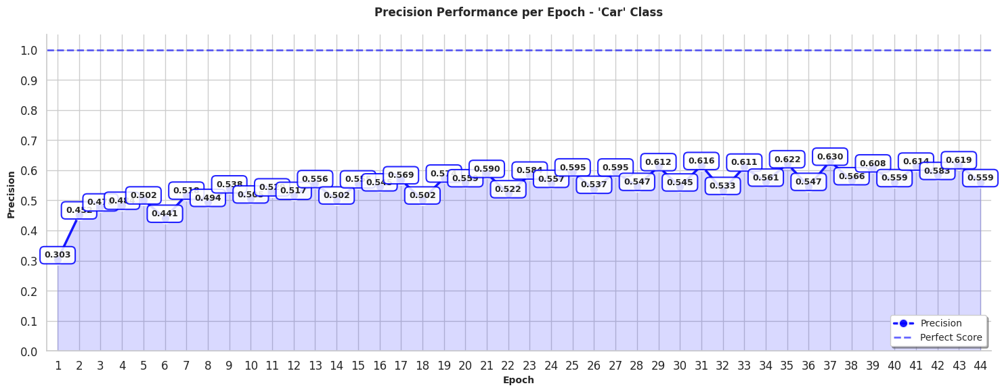

In [64]:
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

metrics_values = per_label_metrics["car"]["precision"]
epochs = list(range(1, len(metrics_values) + 1))
plt.figure(figsize=(15, 6))
ax = plt.gca()

main_color = "blue"

sns.lineplot(x=epochs,
             y=metrics_values,
             marker='o',
             linewidth=2.5,
             markersize=10,
             color=main_color,
             markeredgewidth=2,
             markeredgecolor='white',
             alpha=0.9,
             label='Precision')

plt.fill_between(epochs, metrics_values, alpha=0.15, color=main_color)
plt.axhline(y=1.0,
            color='blue',
            linestyle='--',
            linewidth=2,
            alpha=0.6,
            label='Perfect Score')
plt.title("Precision Performance per Epoch - 'Car' Class",
          fontsize=12,
          fontweight='bold',
          pad=20)
plt.xlabel('Epoch', fontsize=10, fontweight='semibold')
plt.ylabel('Precision', fontsize=10, fontweight='semibold')
plt.ylim(0.0, 1.05)
plt.xlim(0.5, len(epochs) + 0.5)
plt.xticks(epochs)
plt.yticks(np.arange(0, 1.1, 0.1))

for x, y in zip(epochs, metrics_values):
    offset = 0.035 if y < 0.92 else -0.055
    va = 'bottom' if offset > 0 else 'top'

    plt.annotate(f'{y:.3f}',
                 xy=(x, y),
                 xytext=(0, offset),
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 fontsize=9,
                 fontweight='bold',
                 bbox=dict(boxstyle='round,pad=0.5',
                           facecolor='white',
                           edgecolor=main_color,
                           alpha=0.85,
                           linewidth=1.5))

plt.legend(loc='lower right',
           fontsize=10,
           frameon=True,
           shadow=True,
           fancybox=True)

sns.despine()
plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, f"{best_job_name}_car_precision.png"),
            dpi=300,
            bbox_inches='tight',
            facecolor='white')
plt.show()

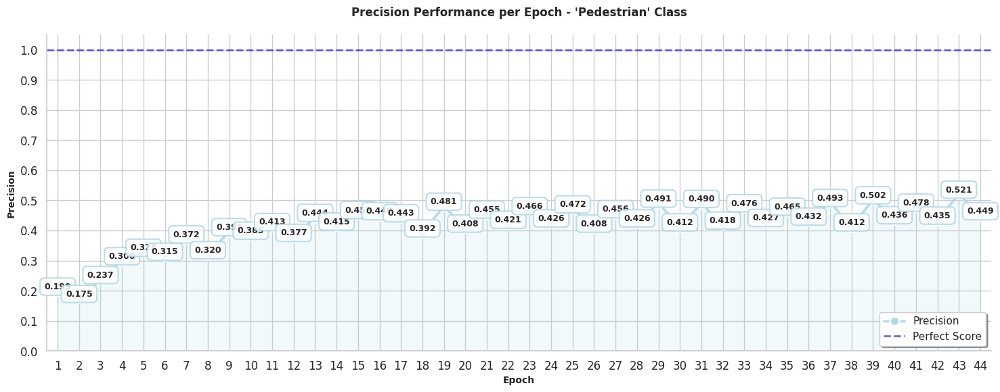

In [65]:
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

metrics_values = per_label_metrics["pedestrian"]["precision"]
epochs = list(range(1, len(metrics_values) + 1))
plt.figure(figsize=(15, 6))
ax = plt.gca()

main_color = "lightblue"

sns.lineplot(x=epochs,
             y=metrics_values,
             marker='o',
             linewidth=2.5,
             markersize=10,
             color=main_color,
             markeredgewidth=2,
             markeredgecolor='white',
             alpha=0.9,
             label='Precision')

plt.fill_between(epochs, metrics_values, alpha=0.15, color=main_color)
plt.axhline(y=1.0,
            color='blue',
            linestyle='--',
            linewidth=2,
            alpha=0.6,
            label='Perfect Score')
plt.title("Precision Performance per Epoch - 'Pedestrian' Class",
          fontsize=12,
          fontweight='bold',
          pad=20)
plt.xlabel('Epoch', fontsize=10, fontweight='semibold')
plt.ylabel('Precision', fontsize=10, fontweight='semibold')
plt.ylim(0.0, 1.05)
plt.xlim(0.5, len(epochs) + 0.5)
plt.xticks(epochs)
plt.yticks(np.arange(0, 1.1, 0.1))

for x, y in zip(epochs, metrics_values):
    offset = 0.035 if y < 0.92 else -0.055
    va = 'bottom' if offset > 0 else 'top'

    plt.annotate(f'{y:.3f}',
                 xy=(x, y),
                 xytext=(0, offset),
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 fontsize=9,
                 fontweight='bold',
                 bbox=dict(boxstyle='round,pad=0.5',
                           facecolor='white',
                           edgecolor=main_color,
                           alpha=0.85,
                           linewidth=1.5))

plt.legend(loc='lower right',
           fontsize=11,
           frameon=True,
           shadow=True,
           fancybox=True)

sns.despine()
plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, f"{best_job_name}_pedestrian_precision.png"),
            dpi=300,
            bbox_inches='tight',
            facecolor='white')
plt.show()

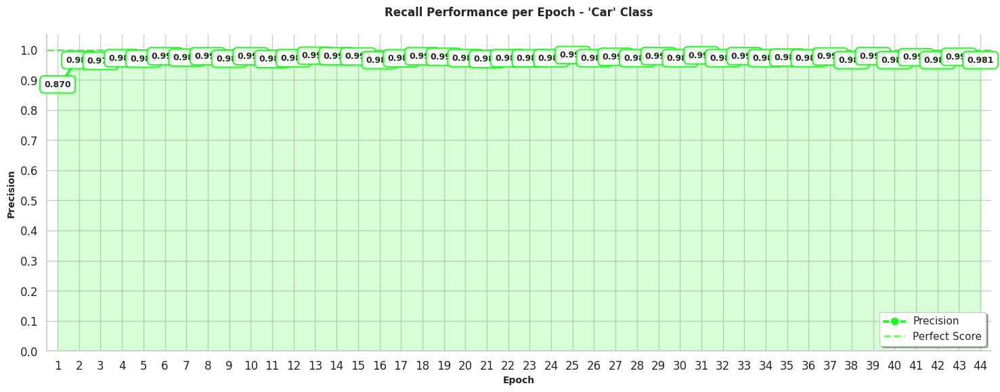

In [66]:
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

metrics_values = per_label_metrics["car"]["recall"]
epochs = list(range(1, len(metrics_values) + 1))
plt.figure(figsize=(15, 6))
ax = plt.gca()

main_color = "lime"

sns.lineplot(x=epochs,
             y=metrics_values,
             marker='o',
             linewidth=2.5,
             markersize=10,
             color=main_color,
             markeredgewidth=2,
             markeredgecolor='white',
             alpha=0.9,
             label='Precision')

plt.fill_between(epochs, metrics_values, alpha=0.15, color=main_color)
plt.axhline(y=1.0,
            color=main_color,
            linestyle='--',
            linewidth=2,
            alpha=0.6,
            label='Perfect Score')
plt.title("Recall Performance per Epoch - 'Car' Class",
          fontsize=12,
          fontweight='bold',
          pad=20)
plt.xlabel('Epoch', fontsize=10, fontweight='semibold')
plt.ylabel('Precision', fontsize=10, fontweight='semibold')
plt.ylim(0.0, 1.05)
plt.xlim(0.5, len(epochs) + 0.5)
plt.xticks(epochs)
plt.yticks(np.arange(0, 1.1, 0.1))

for x, y in zip(epochs, metrics_values):
    offset = 0.035 if y < 0.92 else -0.055
    va = 'bottom' if offset > 0 else 'top'

    plt.annotate(f'{y:.3f}',
                 xy=(x, y),
                 xytext=(0, offset),
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 fontsize=9,
                 fontweight='bold',
                 bbox=dict(boxstyle='round,pad=0.5',
                           facecolor='white',
                           edgecolor=main_color,
                           alpha=0.85,
                           linewidth=1.5))

plt.legend(loc='lower right',
           fontsize=11,
           frameon=True,
           shadow=True,
           fancybox=True)

sns.despine()
plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, f"{best_job_name}_car_recall.png"),
            dpi=300,
            bbox_inches='tight',
            facecolor='white')
plt.show()

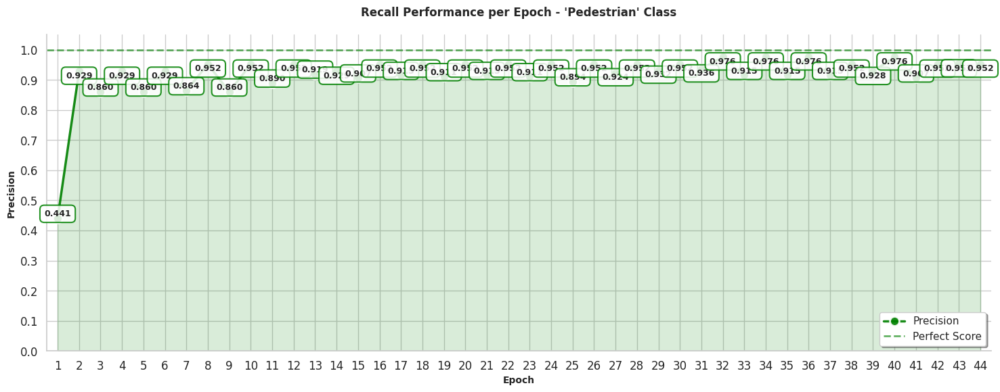

In [67]:
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

metrics_values = per_label_metrics["pedestrian"]["recall"]
epochs = list(range(1, len(metrics_values) + 1))
plt.figure(figsize=(15, 6))
ax = plt.gca()

main_color = "green"

sns.lineplot(x=epochs,
             y=metrics_values,
             marker='o',
             linewidth=2.5,
             markersize=10,
             color=main_color,
             markeredgewidth=2,
             markeredgecolor='white',
             alpha=0.9,
             label='Precision')

plt.fill_between(epochs, metrics_values, alpha=0.15, color=main_color)
plt.axhline(y=1.0,
            color=main_color,
            linestyle='--',
            linewidth=2,
            alpha=0.6,
            label='Perfect Score')
plt.title("Recall Performance per Epoch - 'Pedestrian' Class",
          fontsize=12,
          fontweight='bold',
          pad=20)
plt.xlabel('Epoch', fontsize=10, fontweight='semibold')
plt.ylabel('Precision', fontsize=10, fontweight='semibold')
plt.ylim(0.0, 1.05)
plt.xlim(0.5, len(epochs) + 0.5)
plt.xticks(epochs)
plt.yticks(np.arange(0, 1.1, 0.1))

for x, y in zip(epochs, metrics_values):
    offset = 0.035 if y < 0.92 else -0.055
    va = 'bottom' if offset > 0 else 'top'

    plt.annotate(f'{y:.3f}',
                 xy=(x, y),
                 xytext=(0, offset),
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 fontsize=9,
                 fontweight='bold',
                 bbox=dict(boxstyle='round,pad=0.5',
                           facecolor='white',
                           edgecolor=main_color,
                           alpha=0.85,
                           linewidth=1.5))

plt.legend(loc='lower right',
           fontsize=11,
           frameon=True,
           shadow=True,
           fancybox=True)

sns.despine()
plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, f"{best_job_name}_pedestrian_recall.png"),
            dpi=300,
            bbox_inches='tight',
            facecolor='white')
plt.show()

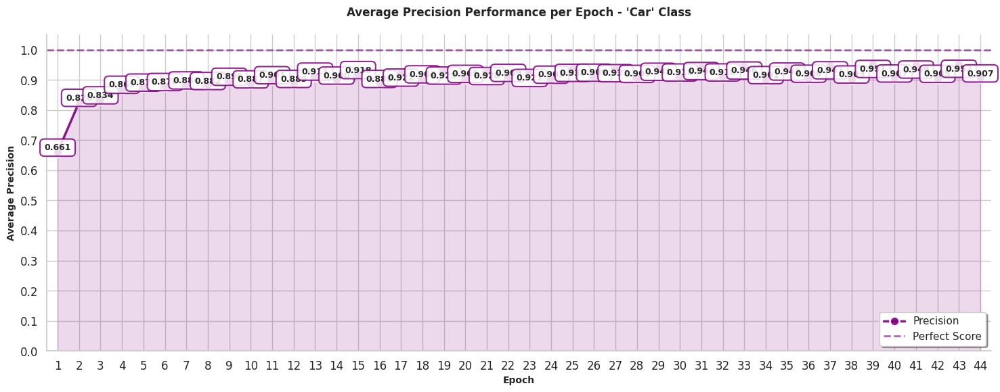

In [68]:
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

metrics_values = per_label_metrics["car"]["average_precision"]
epochs = list(range(1, len(metrics_values) + 1))
plt.figure(figsize=(15, 6))
ax = plt.gca()

main_color = "purple"

sns.lineplot(x=epochs,
             y=metrics_values,
             marker='o',
             linewidth=2.5,
             markersize=10,
             color=main_color,
             markeredgewidth=2,
             markeredgecolor='white',
             alpha=0.9,
             label='Precision')

plt.fill_between(epochs, metrics_values, alpha=0.15, color=main_color)
plt.axhline(y=1.0,
            color=main_color,
            linestyle='--',
            linewidth=2,
            alpha=0.6,
            label='Perfect Score')
plt.title("Average Precision Performance per Epoch - 'Car' Class",
          fontsize=12,
          fontweight='bold',
          pad=20)
plt.xlabel('Epoch', fontsize=10, fontweight='semibold')
plt.ylabel('Average Precision', fontsize=10, fontweight='semibold')
plt.ylim(0.0, 1.05)
plt.xlim(0.5, len(epochs) + 0.5)
plt.xticks(epochs)
plt.yticks(np.arange(0, 1.1, 0.1))

for x, y in zip(epochs, metrics_values):
    offset = 0.035 if y < 0.92 else -0.055
    va = 'bottom' if offset > 0 else 'top'

    plt.annotate(f'{y:.3f}',
                 xy=(x, y),
                 xytext=(0, offset),
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 fontsize=9,
                 fontweight='bold',
                 bbox=dict(boxstyle='round,pad=0.5',
                           facecolor='white',
                           edgecolor=main_color,
                           alpha=0.85,
                           linewidth=1.5))

plt.legend(loc='lower right',
           fontsize=11,
           frameon=True,
           shadow=True,
           fancybox=True)

sns.despine()
plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, f"{best_job_name}_car_average_precision.png"),
            dpi=300,
            bbox_inches='tight',
            facecolor='white')
plt.show()

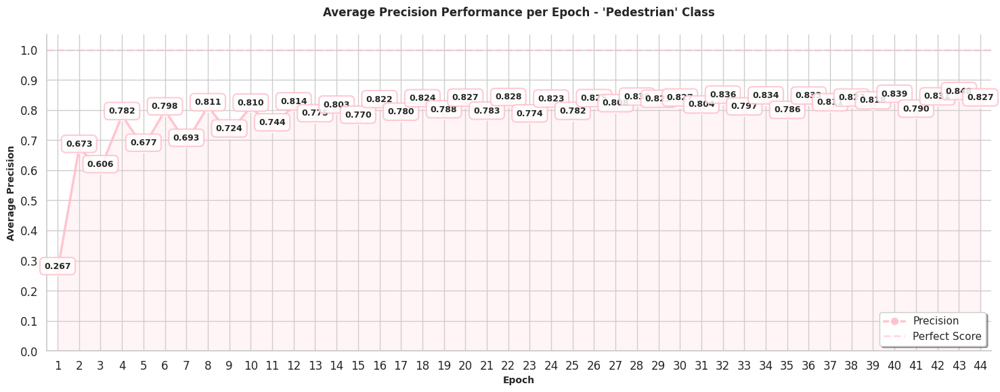

In [69]:
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

metrics_values = per_label_metrics["pedestrian"]["average_precision"]
epochs = list(range(1, len(metrics_values) + 1))
plt.figure(figsize=(15, 6))
ax = plt.gca()

main_color = "pink"

sns.lineplot(x=epochs,
             y=metrics_values,
             marker='o',
             linewidth=2.5,
             markersize=10,
             color=main_color,
             markeredgewidth=2,
             markeredgecolor='white',
             alpha=0.9,
             label='Precision')

plt.fill_between(epochs, metrics_values, alpha=0.15, color=main_color)
plt.axhline(y=1.0,
            color=main_color,
            linestyle='--',
            linewidth=2,
            alpha=0.6,
            label='Perfect Score')
plt.title("Average Precision Performance per Epoch - 'Pedestrian' Class",
          fontsize=12,
          fontweight='bold',
          pad=20)
plt.xlabel('Epoch', fontsize=10, fontweight='semibold')
plt.ylabel('Average Precision', fontsize=10, fontweight='semibold')
plt.ylim(0.0, 1.05)
plt.xlim(0.5, len(epochs) + 0.5)
plt.xticks(epochs)
plt.yticks(np.arange(0, 1.1, 0.1))

for x, y in zip(epochs, metrics_values):
    offset = 0.035 if y < 0.92 else -0.055
    va = 'bottom' if offset > 0 else 'top'

    plt.annotate(f'{y:.3f}',
                 xy=(x, y),
                 xytext=(0, offset),
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 fontsize=9,
                 fontweight='bold',
                 bbox=dict(boxstyle='round,pad=0.5',
                           facecolor='white',
                           edgecolor=main_color,
                           alpha=0.85,
                           linewidth=1.5))

plt.legend(loc='lower right',
           fontsize=11,
           frameon=True,
           shadow=True,
           fancybox=True)

sns.despine()
plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, f"{best_job_name}_pedestrian_average_precision.png"),
            dpi=300,
            bbox_inches='tight',
            facecolor='white')
plt.show()

In [70]:
!ls $MODEL_DIR -lh

total 2.1M
drwxrwxrwx 2 root root    0 Feb 12 12:03 outputs
-rwxrwxrwx 1 root root 357K Feb 12 12:10 salmon_nail_3701hgnjxr_car_average_precision.png
-rwxrwxrwx 1 root root 375K Feb 12 12:09 salmon_nail_3701hgnjxr_car_precision.png
-rwxrwxrwx 1 root root 265K Feb 12 12:10 salmon_nail_3701hgnjxr_car_recall.png
-rwxrwxrwx 1 root root 367K Feb 12 12:10 salmon_nail_3701hgnjxr_pedestrian_average_precision.png
-rwxrwxrwx 1 root root 367K Feb 12 12:09 salmon_nail_3701hgnjxr_pedestrian_precision.png
-rwxrwxrwx 1 root root 338K Feb 12 12:10 salmon_nail_3701hgnjxr_pedestrian_recall.png
drwxrwxrwx 2 root root    0 Feb 12 12:06 train_artifacts


## 11. Saving the model into the repository

In [71]:
model_name = "streetview-automl-instance-segmentation-cvmodel"
model_description = "street view automl instance segmentation model"

In [72]:
start = time.time()

print(f"🏆 Registering the best model '{model_name}'")

model = Model(
    path=
    f"azureml://jobs/{best_run.info.run_id}/outputs/artifacts/outputs/mlflow-model/",  # Model path
    name=model_name,  # Model name
    description=model_description,  # Description
    type=AssetTypes.MLFLOW_MODEL,  # Type
    tags=tags,  # Optional tags
)

registered_model = ml_client.models.create_or_update(model)

minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

🏆 Registering the best model 'streetview-automl-instance-segmentation-cvmodel'
✅ Done. Elapsed time = 0 minutes and 3 seconds


In [220]:
#print(registered_model)

In [73]:
# Get the latest version
registered_model = ml_client.models.get(
    name=model_name,
    version=registered_model.version  # or use a specific version number
)

# Display the model properties
print(f"📦 Model Name: {registered_model.name}")
print(f"🔢 Version: {registered_model.version}")
print(f"📝 Description: {registered_model.description}")
print(f"🏷️ Type: {registered_model.type}")
print(f"🏷️ Tags: {registered_model.tags}")
print(f"⚙️ Properties: {registered_model.properties}")

📦 Model Name: streetview-automl-instance-segmentation-cvmodel
🔢 Version: 1
📝 Description: street view automl instance segmentation model
🏷️ Type: mlflow_model
🏷️ Tags: {'cloud provider': 'Microsoft Azure', 'data source': 'https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images', 'department': 'Data science', 'topic': 'Images instance segmentation', 'tools': 'AutoML for images Azure ML', 'usecase': 'Street instance segmentation 2025', 'tags': 'car, pedestrian', 'version': '1.0'}
⚙️ Properties: {}


In [222]:
# Get latest version without specifying version number
registered_model = ml_client.models.get(
    name=model_name,
    label="latest"  # Gets the latest version
)

In [223]:
model_dict = {
    "name": registered_model.name,
    "version": registered_model.version,
    "description": registered_model.description,
    #"path": registered_model.path,
    "type": registered_model.type,
    "tags": registered_model.tags,
    "properties": registered_model.properties,
    #"id": registered_model.id
}

print(json.dumps(model_dict, indent=4))

{
    "name": "streetview-automl-instance-segmentation-cvmodel",
    "version": "1",
    "description": "street view automl instance segmentation model",
    "type": "mlflow_model",
    "tags": {
        "author": "Serge Retkowsky",
        "cloud provider": "Microsoft Azure",
        "data source": "https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images",
        "date": "November 2025",
        "department": "Data science",
        "topic": "Images instance segmentation",
        "tools": "AutoML for images Azure ML",
        "usecase": "Street instance segmentation 2025",
        "tags": "car, pedestrian",
        "version": "1.0"
    },
    "properties": {}
}


![Example](img/model1.jpg)

## 12. Creating managed endpoint

In [227]:
online_endpoint_name = "streetview-vision-mngd-endpoint"
online_endpoint_description = "street view computer vision instance segmentation endpoint"

In [228]:
# Create an online endpoint
endpoint = ManagedOnlineEndpoint(
    name=online_endpoint_name,
    description=online_endpoint_description,
    auth_mode="key",
    tags=tags,
)

print(endpoint)

auth_mode: key
description: street view computer vision instance segmentation endpoint
mirror_traffic: {}
name: streetview-vision-mngd-endpoint
properties: {}
tags:
  author: Serge Retkowsky
  cloud provider: Microsoft Azure
  data source: https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images
  date: November 2025
  department: Data science
  tags: car, pedestrian
  tools: AutoML for images Azure ML
  topic: Images instance segmentation
  usecase: Street instance segmentation 2025
  version: '1.0'
traffic: {}



In [229]:
start = time.time()

print(f"Create managed online endpoint '{online_endpoint_name}'... Please wait.")
ml_client.begin_create_or_update(endpoint).result()

minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

Create managed online endpoint 'streetview-vision-mngd-endpoint'... Please wait.
✅ Done. Elapsed time = 1 minutes and 4 seconds


In [230]:
endpoint = ml_client.online_endpoints.get(name=online_endpoint_name)

print(f"📌 Endpoint name: {endpoint.name}")
print(f"🌐 Scoring URI: {endpoint.scoring_uri}")
print(f"📄 Swagger/OpenAPI URI: {endpoint.openapi_uri}")
print(f"⚙️ Provisioning state: {endpoint.provisioning_state}")
print(f"🔐 Auth mode: {endpoint.auth_mode}")
print(f"📝 Description: {endpoint.description}")
print(f"🏷️ Tags: {endpoint.tags}")
print(f"📍 Location: {endpoint.location}")
print(f"🆔 Identity type: {endpoint.identity.type}")
print(f"🔑 Identity principal ID: {endpoint.identity.principal_id}")
print(f"🚦 Traffic allocation: {endpoint.traffic}")
print(f"🪞 Mirror traffic: {endpoint.mirror_traffic}")

📌 Endpoint name: streetview-vision-mngd-endpoint
🌐 Scoring URI: https://streetview-vision-mngd-endpoint.westeurope.inference.ml.azure.com/score
📄 Swagger/OpenAPI URI: https://streetview-vision-mngd-endpoint.westeurope.inference.ml.azure.com/swagger.json
⚙️ Provisioning state: Succeeded
🔐 Auth mode: key
📝 Description: street view computer vision instance segmentation endpoint
🏷️ Tags: {'author': 'Serge Retkowsky', 'cloud provider': 'Microsoft Azure', 'data source': 'https://www.researchgate.net/publication/235039555_StreetScenes_Towards_Scene_Understanding_in_Still_Images', 'date': 'November 2025', 'department': 'Data science', 'topic': 'Images instance segmentation', 'tools': 'AutoML for images Azure ML', 'usecase': 'Street instance segmentation 2025', 'tags': 'car, pedestrian', 'version': '1.0'}
📍 Location: westeurope
🆔 Identity type: system_assigned
🔑 Identity principal ID: d8e8c402-5d55-48fa-bfd8-aec7ee24a929
🚦 Traffic allocation: {}
🪞 Mirror traffic: {}


![Example](img/endpoint1.jpg)

## 13. Deploying the model

In [231]:
deployment_pool_name = "streetview-mlflow"
instance_type = "Standard_NC4as_T4_v3"

In [232]:
deployment = ManagedOnlineDeployment(
    name=deployment_pool_name,  # Name
    endpoint_name=online_endpoint_name,  # Endpoint name
    model=registered_model.id,  # Model
    instance_type=instance_type,  # GPU instance
    instance_count=1,  # 1 instance is ok to test
    liveness_probe=ProbeSettings(
        failure_threshold=30,  # Max failures before restart
        success_threshold=1,  # Success count before healthy
        timeout=2,  # Seconds before probe times out
        period=10,  # Interval between checks
        initial_delay=2000,  # Delay before first check
    ),
    readiness_probe=ProbeSettings(
        failure_threshold=10,  # Max failures before marking unready
        success_threshold=1,  # Seconds before probe times out
        timeout=10,  # Seconds before probe times out
        period=10,  # Interval between checks
        initial_delay=2000,  # Delay before first check
    ),
)

In [233]:
print("🤖 Starting to deploy the model")
print("Please wait.\n")

start = time.time()

ml_client.online_deployments.begin_create_or_update(deployment).result()

minutes, seconds = divmod((time.time() - start), 60)
print(f"\n✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

🤖 Starting to deploy the model
Please wait.



Check: endpoint streetview-vision-mngd-endpoint exists


.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................
✅ Done. Elapsed time = 48 minutes and 42 seconds


![Example](img/endpoint2.jpg)

In [235]:
print("⏳ Updating the deployment...")

start = time.time()

# Routes 100% of traffic to the deployment pool
endpoint.traffic = {deployment_pool_name: 100} 
ml_client.begin_create_or_update(endpoint).result()

minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

⏳ Updating the deployment...


Readonly attribute principal_id will be ignored in class <class 'azure.ai.ml._restclient.v2022_05_01.models._models_py3.ManagedServiceIdentity'>
Readonly attribute tenant_id will be ignored in class <class 'azure.ai.ml._restclient.v2022_05_01.models._models_py3.ManagedServiceIdentity'>


✅ Done. Elapsed time = 1 minutes and 32 seconds


In [236]:
endpoint = ml_client.online_endpoints.get(name=online_endpoint_name)

print(f"🎯 Endpoint traffic details: {endpoint.traffic}")
print(f"🏅 Endpoint scoring URI: {endpoint.scoring_uri}")

🎯 Endpoint traffic details: {'streetview-mlflow': 100}
🏅 Endpoint scoring URI: https://streetview-vision-mngd-endpoint.westeurope.inference.ml.azure.com/score


In [237]:
# Get the deployment object
deployment_info = ml_client.online_deployments.get(
    name=deployment_pool_name,
    endpoint_name=online_endpoint_name,
)

print(f"🚀 Deployment Name: {deployment_info.name}")
print(f"✅ Provisioning State: {deployment_info.provisioning_state}")
print(f"🖥️ Instance Type: {deployment_info.instance_type}")
print(f"🔢 Instance Count: {deployment_info.instance_count}")
#print(f"🤖 Model: {deployment_info.model}")

print("\n🩺 Liveness Probe:")
print(f"  ❌ Failure Threshold: {deployment_info.liveness_probe.failure_threshold}")
print(f"  ⏳ Initial Delay: {deployment_info.liveness_probe.initial_delay}")
print(f"  🔄 Period: {deployment_info.liveness_probe.period}")

print("\n📡 Readiness Probe:")
print(f"  ❌ Failure Threshold: {deployment_info.readiness_probe.failure_threshold}")
print(f"  ⏳ Initial Delay: {deployment_info.readiness_probe.initial_delay}")

🚀 Deployment Name: streetview-mlflow
✅ Provisioning State: Succeeded
🖥️ Instance Type: Standard_NC4as_T4_v3
🔢 Instance Count: 1

🩺 Liveness Probe:
  ❌ Failure Threshold: 30
  ⏳ Initial Delay: 2000
  🔄 Period: 10

📡 Readiness Probe:
  ❌ Failure Threshold: 10
  ⏳ Initial Delay: 2000


In [238]:
# Get endpoint information
endpoint_info = ml_client.online_endpoints.get(name=online_endpoint_name)

print(f"🔗 Endpoint Name: {endpoint_info.name}")
print(f"📡 Scoring URI: {endpoint_info.scoring_uri}")
print(f"📜 Swagger URI: {endpoint_info.openapi_uri}")
#print(f"✅ Provisioning State: {endpoint_info}")

🔗 Endpoint Name: streetview-vision-mngd-endpoint
📡 Scoring URI: https://streetview-vision-mngd-endpoint.westeurope.inference.ml.azure.com/score
📜 Swagger URI: https://streetview-vision-mngd-endpoint.westeurope.inference.ml.azure.com/swagger.json


![Example](img/endpoint3.jpg)

![Example](img/endpoint4.jpg)

## 14. Testing the deployed model

### Example 1

In [239]:
test_image = os.path.join(TEST_DIR, "test_001.jpg")

!ls $test_image -lh

-rwxrwxrwx 1 root root 99K Nov  7 13:45 tests/test_001.jpg


Image file: tests/test_001.jpg


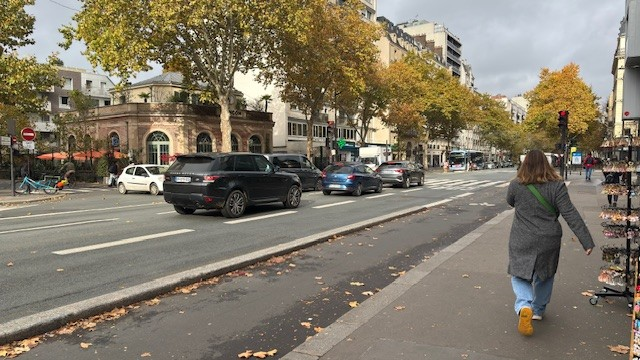

In [240]:
img = Image.open(test_image)
print(f"Image file: {test_image}")
img

In [241]:
start = time.time()
predictions = get_predictions(test_image)
print(f"✅ Done in {(time.time() - start):.3f} seconds")

✅ Done in 2.339 seconds


In [242]:
print(json.dumps(predictions, indent=5))

[
     {
          "boxes": [
               {
                    "box": {
                         "topX": 0.2457482658228776,
                         "topY": 0.41376213073730467,
                         "bottomX": 0.48311988587227367,
                         "bottomY": 0.6145846048990885
                    },
                    "label": "car",
                    "score": 0.9957783222198486,
                    "polygon": [
                         [
                              0.3611632270168856,
                              0.61,
                              0.3151969981238274,
                              0.61,
                              0.27298311444652906,
                              0.605,
                              0.26360225140712945,
                              0.5983333333333334,
                              0.2589118198874296,
                              0.5883333333333334,
                              0.25328330206378985,
                         

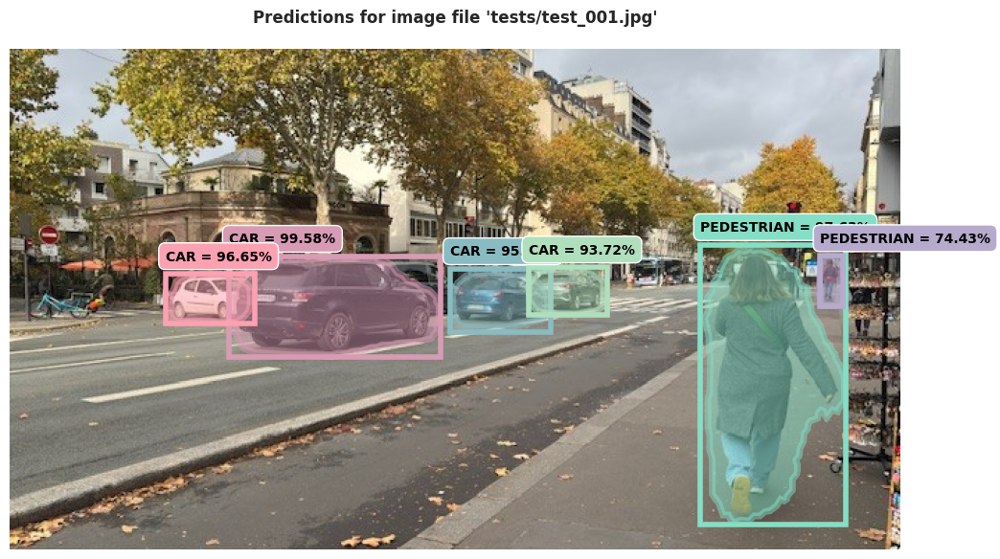

💾 Image output saved: results/test_001_predictions.jpg


'results/test_001_predictions.jpg'

In [243]:
view_results(test_image, predictions, min_conf=0.5)

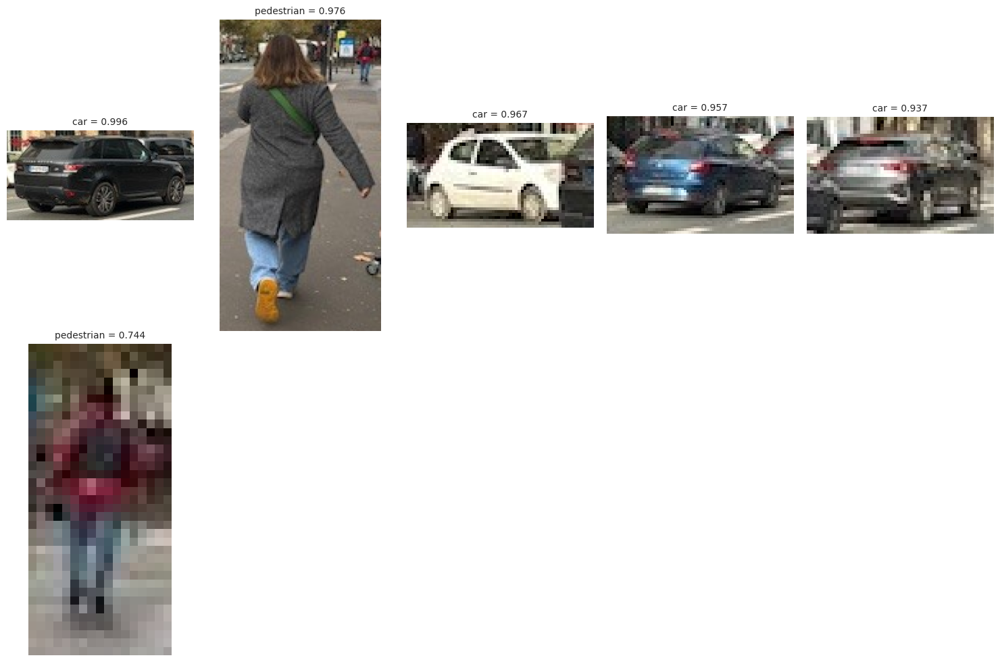

In [244]:
extract_and_display_objects(test_image, predictions, min_conf=0.5)

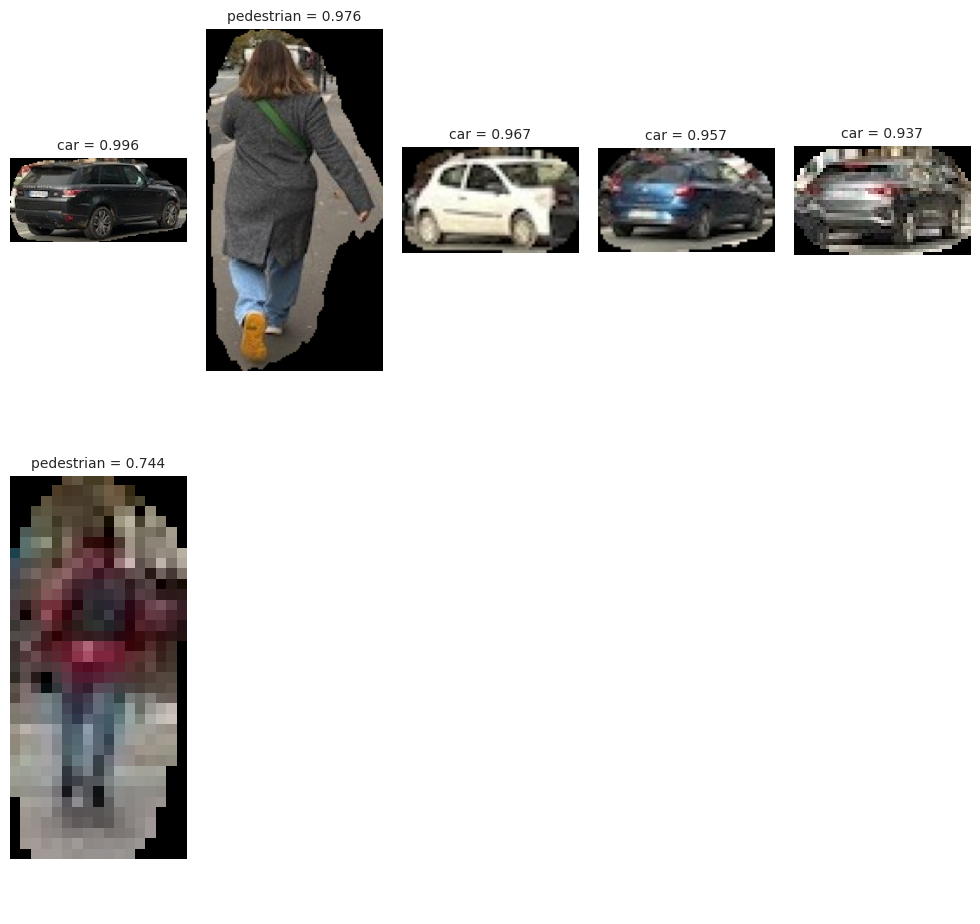

In [245]:
extract_and_display_polygons(test_image, predictions, min_conf=0.5)

### Example 2

In [246]:
test_image = os.path.join(TEST_DIR, "test_013.jpg")

!ls $test_image -lh

-rwxrwxrwx 1 root root 1.1M Nov  7 08:58 tests/test_013.jpg


Image file: tests/test_013.jpg


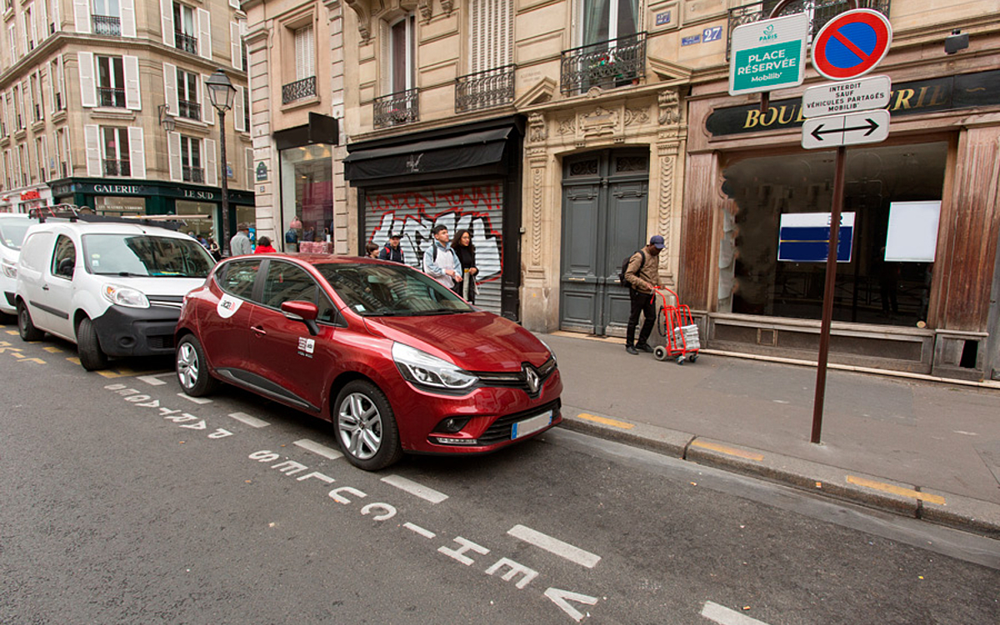

In [247]:
print(f"Image file: {test_image}")
img = Image.open(test_image)
img

In [248]:
start = time.time()
predictions = get_predictions(test_image)
print(f"✅ Done in {(time.time() - start):.3f} seconds")

✅ Done in 1.359 seconds


In [249]:
print(json.dumps(predictions, indent=5))

[
     {
          "boxes": [
               {
                    "box": {
                         "topX": 0.15753691991170246,
                         "topY": 0.39260533650716145,
                         "bottomX": 0.5779725392659505,
                         "bottomY": 0.755760752360026
                    },
                    "label": "car",
                    "score": 0.9933332800865173,
                    "polygon": [
                         [
                              0.41458333333333336,
                              0.7483333333333333,
                              0.36875,
                              0.7483333333333333,
                              0.34375,
                              0.7433333333333333,
                              0.32708333333333334,
                              0.7266666666666667,
                              0.3125,
                              0.7183333333333334,
                              0.3020833333333333,
                    

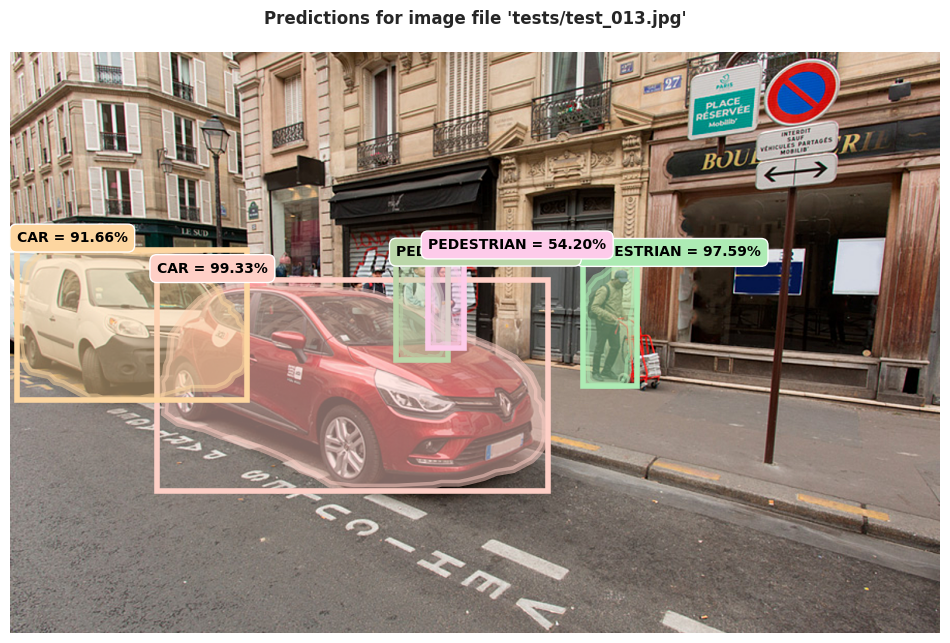

💾 Image output saved: results/test_013_predictions.jpg


'results/test_013_predictions.jpg'

In [250]:
view_results(test_image, predictions, min_conf=0.5)

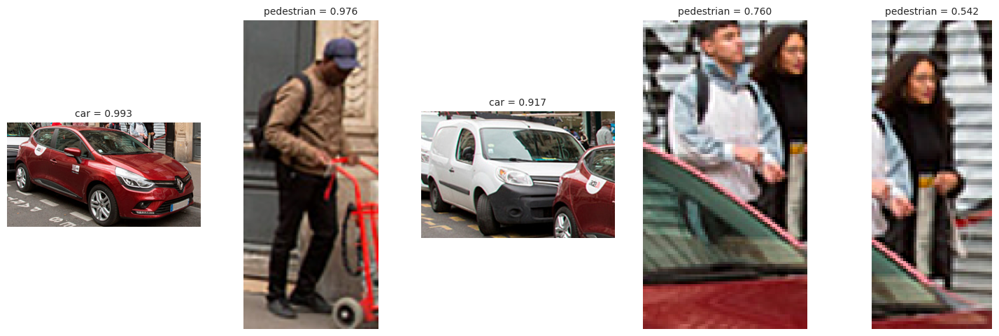

In [251]:
extract_and_display_objects(test_image, predictions, min_conf=0.5)

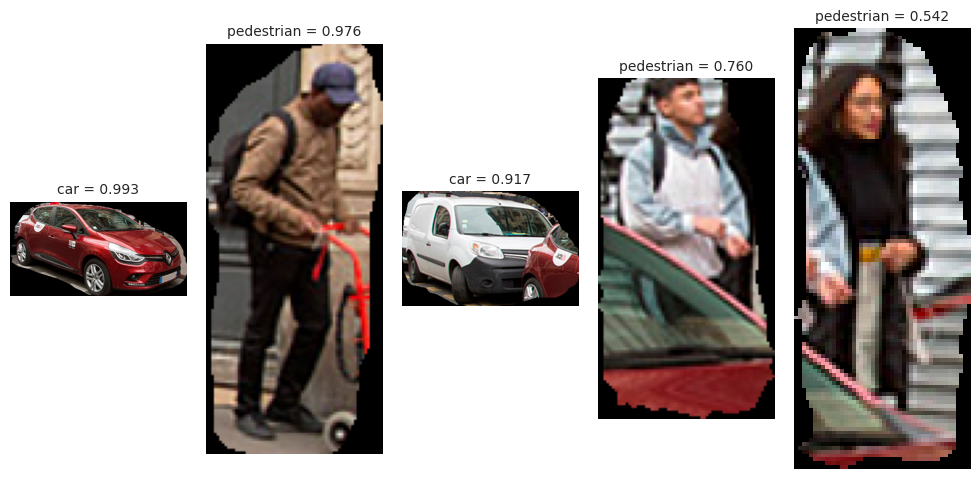

In [252]:
extract_and_display_polygons(test_image, predictions, min_conf=0.5)